# Network Traffic Classification

## 1. EDA

**This section simply runs the EDA from EDA.ipynb.**

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3577296 entries, 0 to 3577295
Data columns (total 87 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Flow.ID                      object 
 1   Source.IP                    object 
 2   Source.Port                  int64  
 3   Destination.IP               object 
 4   Destination.Port             int64  
 5   Protocol                     int64  
 6   Timestamp                    object 
 7   Flow.Duration                int64  
 8   Total.Fwd.Packets            int64  
 9   Total.Backward.Packets       int64  
 10  Total.Length.of.Fwd.Packets  int64  
 11  Total.Length.of.Bwd.Packets  float64
 12  Fwd.Packet.Length.Max        int64  
 13  Fwd.Packet.Length.Min        int64  
 14  Fwd.Packet.Length.Mean       float64
 15  Fwd.Packet.Length.Std        float64
 16  Bwd.Packet.Length.Max        int64  
 17  Bwd.Packet.Length.Min        int64  
 18  Bwd.Packet.Length.Mean       float64
 19  

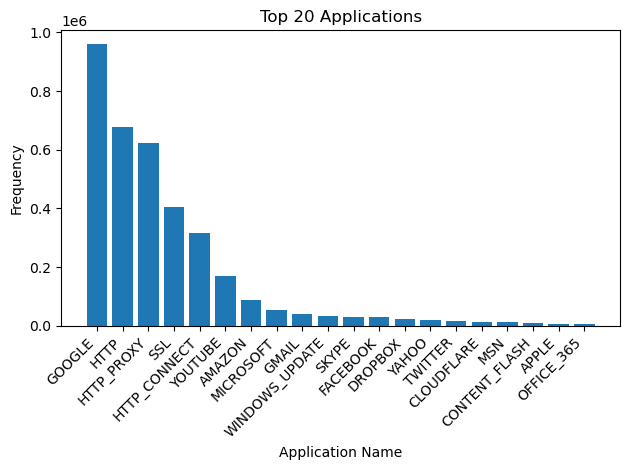

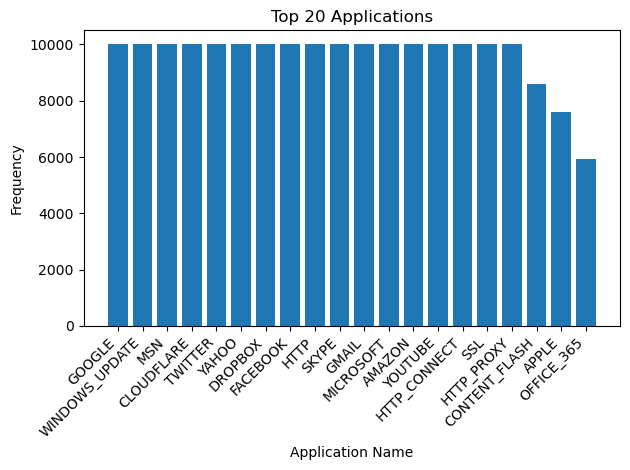

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192143 entries, 0 to 192142
Data columns (total 77 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Flow.ID                      object 
 1   Source.IP                    object 
 2   Source.Port                  int64  
 3   Destination.IP               object 
 4   Destination.Port             int64  
 5   Protocol                     int64  
 6   Timestamp                    object 
 7   Flow.Duration                int64  
 8   Total.Fwd.Packets            int64  
 9   Total.Backward.Packets       int64  
 10  Total.Length.of.Fwd.Packets  int64  
 11  Total.Length.of.Bwd.Packets  float64
 12  Fwd.Packet.Length.Max        int64  
 13  Fwd.Packet.Length.Min        int64  
 14  Fwd.Packet.Length.Mean       float64
 15  Fwd.Packet.Length.Std        float64
 16  Bwd.Packet.Length.Max        int64  
 17  Bwd.Packet.Length.Min        int64  
 18  Bwd.Packet.Length.Mean       float64
 19  Bw

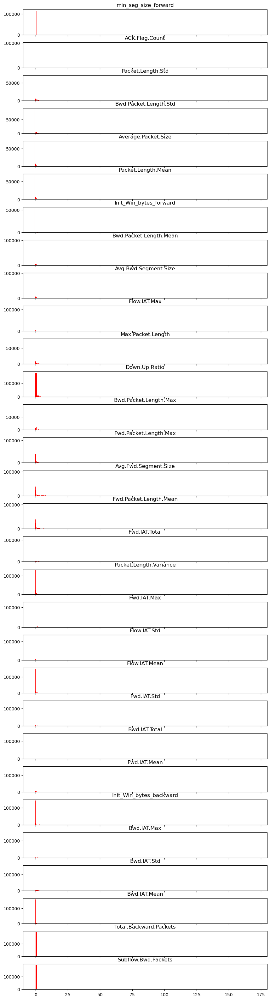

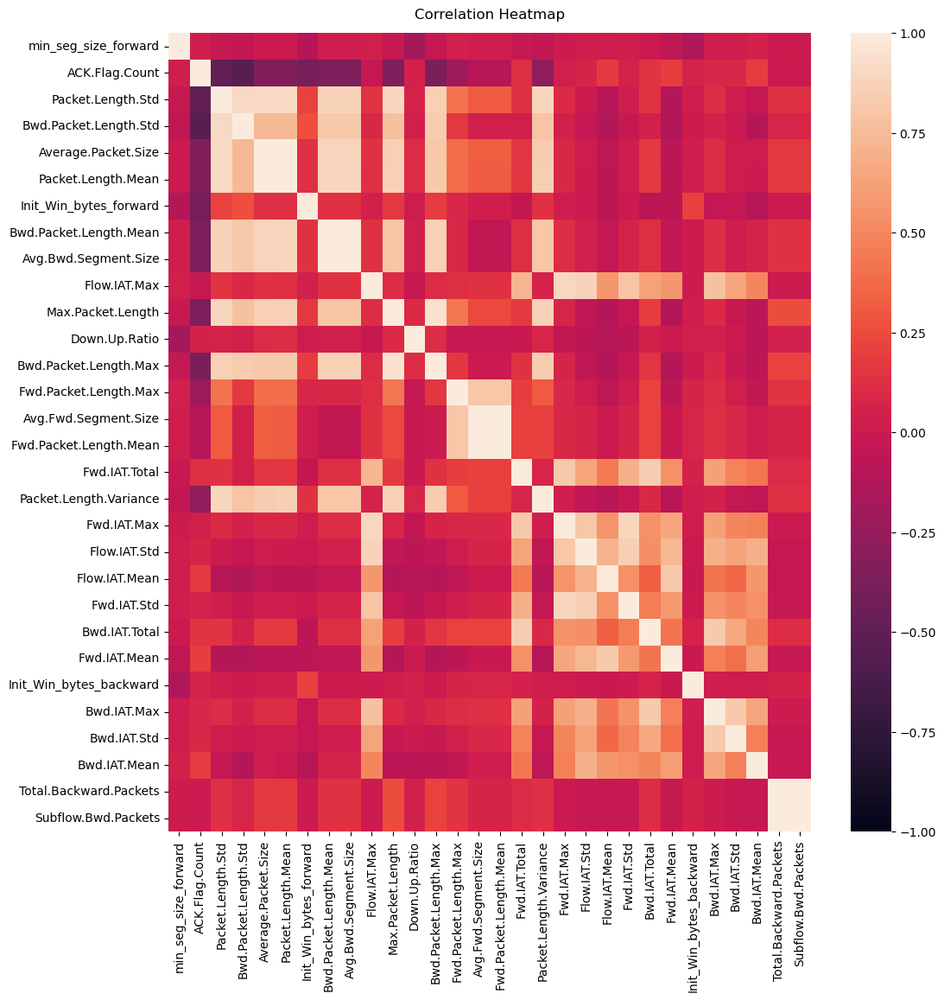

In [1]:
%run ./EDA.ipynb

## 2. Scale and split into train and test data

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

x_data = data.drop(['ProtocolName', 'ProtocolLabel'], axis = 1)
y_data = data['ProtocolLabel']
scaler = StandardScaler()

# normal dataset
X_train, X_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.2)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [3]:
X_train.shape, X_test.shape

((153714, 50), (38429, 50))

In [4]:
x_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192143 entries, 0 to 192142
Data columns (total 50 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Total.Fwd.Packets            192143 non-null  int64  
 1   Total.Backward.Packets       192143 non-null  int64  
 2   Total.Length.of.Fwd.Packets  192143 non-null  int64  
 3   Total.Length.of.Bwd.Packets  192143 non-null  float64
 4   Fwd.Packet.Length.Max        192143 non-null  int64  
 5   Fwd.Packet.Length.Min        192143 non-null  int64  
 6   Fwd.Packet.Length.Mean       192143 non-null  float64
 7   Bwd.Packet.Length.Max        192143 non-null  int64  
 8   Bwd.Packet.Length.Min        192143 non-null  int64  
 9   Bwd.Packet.Length.Mean       192143 non-null  float64
 10  Bwd.Packet.Length.Std        192143 non-null  float64
 11  Flow.Bytes.s                 192143 non-null  float64
 12  Flow.Packets.s               192143 non-null  float64
 13 

## 3. Principal Component Analysis

**Doing PCA with 10 components**

In [5]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(X_train_pca.shape, X_test_pca.shape)

(153714, 10) (38429, 10)


## 4. Feature Selection using Inter-Quartile Range (IQR)

In [6]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.metrics import classification_report


warnings.simplefilter(action='ignore', category=FutureWarning)

from sklearn import set_config
set_config(display="diagram")

In [7]:
# Create a DataFrame with these selected features (based on IQR) and a copy of the 'ProtocolName' column
data_for_prediction_featureSelection = data[top_30_features_by_iqr].copy()
data_for_prediction_featureSelection['ProtocolName'] = data['ProtocolName']
data_for_prediction_featureSelection['ProtocolLabel'] = data['ProtocolLabel']

corrx_dataset = data_for_prediction_featureSelection.drop(['ProtocolName', 'ProtocolLabel'], axis = 1)
corry_dataset = data_for_prediction_featureSelection['ProtocolLabel']
scaler = StandardScaler()


# Split the data for feature selection
X_train_corr, X_test_corr, y_train_corr, y_test_corr = train_test_split(corrx_dataset, corry_dataset, test_size=0.2)

# Standardize the features
sc = StandardScaler()
X_train_corr = sc.fit_transform(X_train_corr)
X_test_corr = sc.transform(X_test_corr)

In [8]:
X_train_corr.shape, X_test_corr.shape

((153714, 30), (38429, 30))

## 5. Common code

In [9]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Draw confusion matrix given predictions and actual values
def draw_confusion_matrix(ytest, pred, title, figname):
    classes = le.classes_.tolist()
    cm = confusion_matrix(ytest, pred)

    # Create a Plotly figure for the confusion matrix
    fig = ff.create_annotated_heatmap(
        z=cm,
        x=classes,
        y=classes,
        colorscale='Viridis')

    # Customize the layout
    fig.update_layout(
        title_text=f'Confusion Matrix for {title}',
        title_y=1,
        #xaxis_title='Predicted',
        yaxis_title='Actual',
        autosize=False,
        width=800,
        height=600)
    # Display the confusion matrix (optional)
    fig.show()
    fig.write_image('images/' + figname + '.png')

    # Display the confusion matrix for github
    ax = plt.subplot()
    sns.heatmap(cm, annot=True, fmt='g', ax=ax, annot_kws={"size": 8},
                square=True, cmap="YlGnBu",linewidths=0.1);  #annot=True to annotate cells, ftm='g' to disable scientific notation
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix'); 
    ax.figure.set_size_inches(10, 10)
    ax.set_xticks(ticks=range(len(classes)), labels=classes, rotation=90, fontsize=8)
    ax.set_yticks(ticks=range(len(classes)), labels=classes, rotation=0, fontsize=8)
    plt.show()

In [10]:
from sklearn.metrics import classification_report

# Display the classification report given predictions and actual model.
# The report has precision, recall and f-1 scores for the individual applications and an average total as well.
def draw_classification_report(ytest, pred, title):
    classes = le.classes_.tolist()

    # Calculate the classification report
    report = classification_report(ytest, pred, target_names=classes, output_dict=True)

    # Convert the classification report to a DataFrame for formatting
    df_report = pd.DataFrame(report).transpose()

    # Display the classification report
    df1 = df_report.style.set_caption(title).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'black'),
        ('font-size', '18px')
    ]}])

    display(df1)

## 6. Logistic Regression

In [11]:
def logistic_regression(Xtrain, ytrain):
    lr = LogisticRegression(random_state=42, solver='saga', max_iter=100)
    lr.fit(Xtrain, ytrain)
    return lr

In [12]:
# logistic regression on PCA dataset
lr = logistic_regression(X_train_pca, y_train)

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



In [13]:
# logistic regression on IQR matrix data
lr_corr = logistic_regression(X_train_corr, y_train_corr)

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



**NOTE:** 
- **I tried increasing the max_iter and also tried with l1 regularization. But the accuracy remained the same and coeficients did not converge.**
- **To save on execution time, I am retaining max_iter of 100 and no regularization.**

In [14]:
lr_pred = lr.predict(X_test_pca)
print('Accuracy in Logistic Regression on PCA Dataset', lr.score(X_test_pca, y_test))
lr_corr_pred = lr_corr.predict(X_test_corr)
print('Accuracy in Logistic Regression on Feature Selection via IQR', lr_corr.score(X_test_corr, y_test_corr))

Accuracy in Logistic Regression on PCA Dataset 0.2287335085482318
Accuracy in Logistic Regression on Feature Selection via IQR 0.30575867183637356


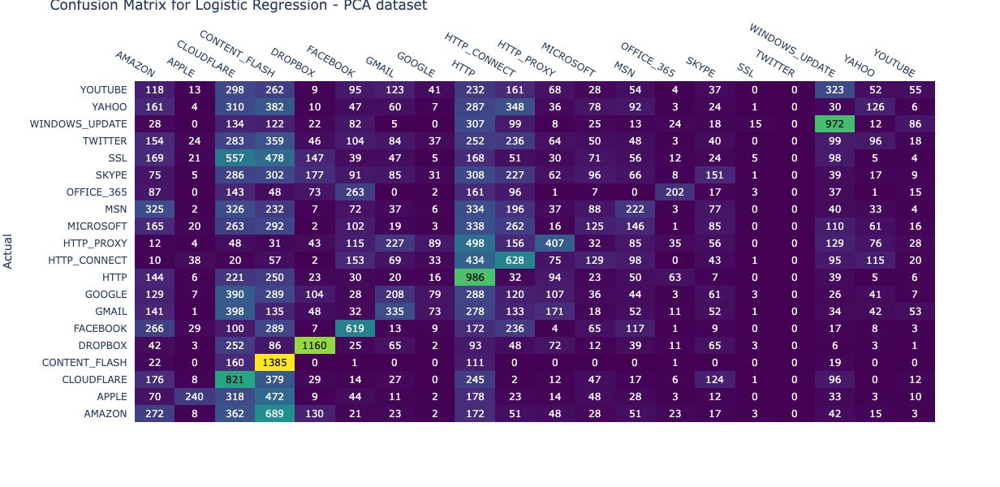

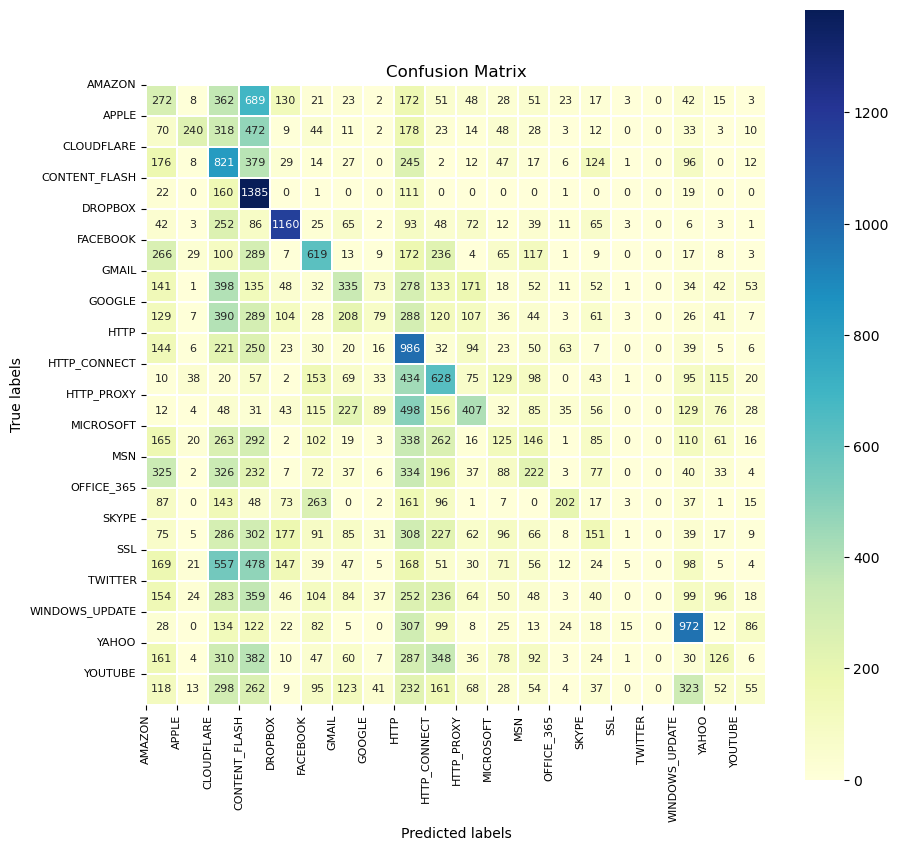

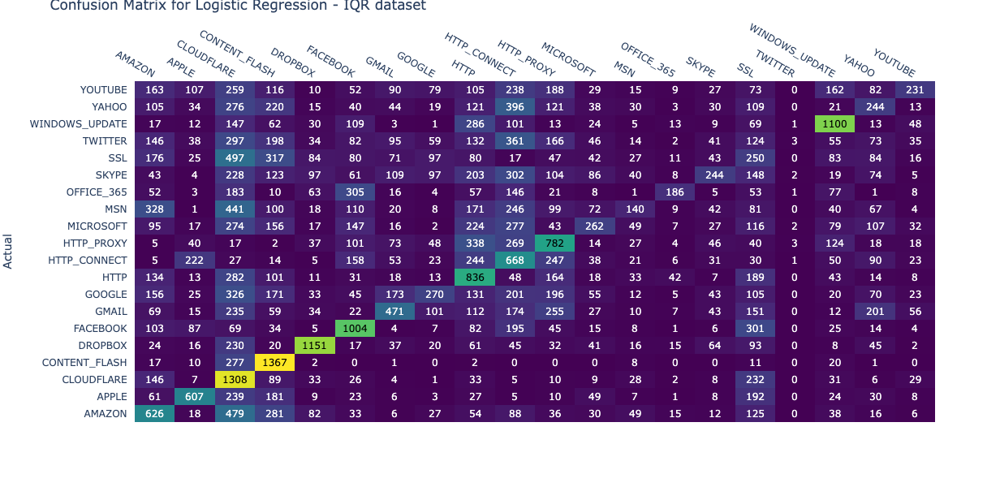

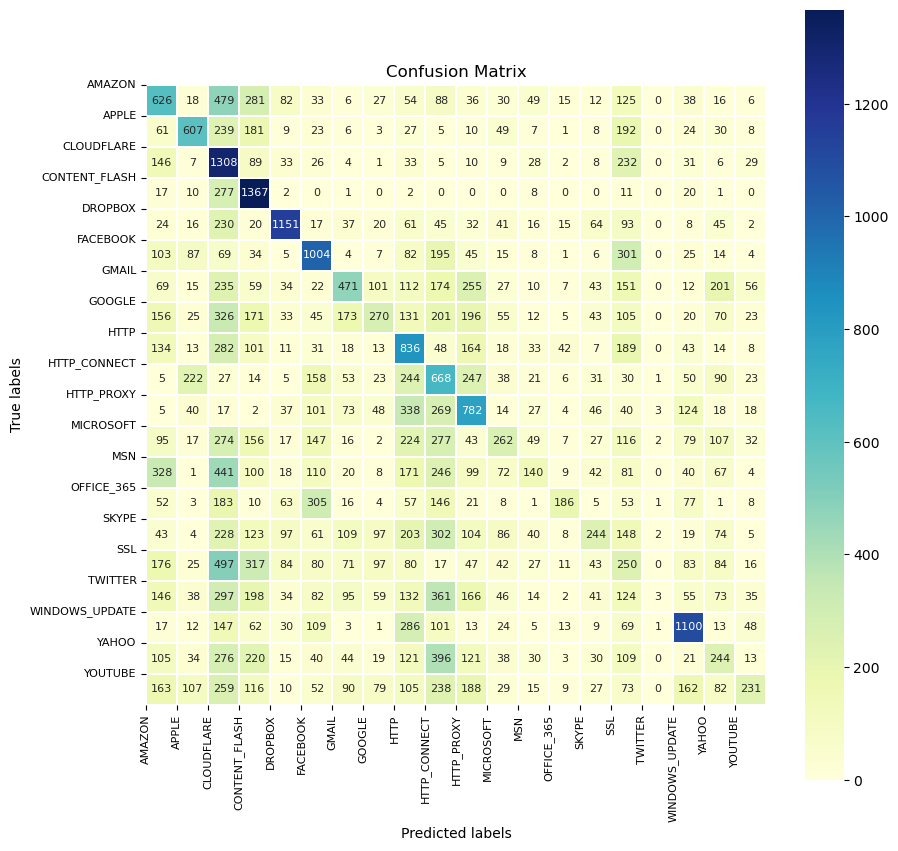

In [15]:
draw_confusion_matrix(y_test, lr_pred, 'Logistic Regression - PCA dataset', 'lr-pca')
draw_confusion_matrix(y_test_corr, lr_corr_pred, 'Logistic Regression - IQR dataset', 'lr-corr')

In [16]:
draw_classification_report(y_test, lr_pred, 'Logistic Regression - PCA dataset')
draw_classification_report(y_test_corr, lr_corr_pred, 'Logistic Regression - IQR dataset')

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
AMAZON,0.106002,0.138776,0.120194,1960.000000
APPLE,0.554273,0.158103,0.246028,1518.000000
CLOUDFLARE,0.144288,0.407242,0.213081,2016.000000
CONTENT_FLASH,0.211806,0.815185,0.336247,1699.000000
DROPBOX,0.566406,0.583501,0.574827,1988.000000
FACEBOOK,0.313101,0.315173,0.314133,1964.000000
GMAIL,0.229767,0.166833,0.193306,2008.000000
GOOGLE,0.180778,0.040102,0.065642,1970.000000
HTTP,0.168778,0.489330,0.250986,2015.000000
HTTP_CONNECT,0.202254,0.310891,0.245073,2020.000000


,precision,recall,f1-score,support
AMAZON,0.253339,0.309748,0.278718,2021.000000
APPLE,0.466564,0.407383,0.434970,1490.000000
CLOUDFLARE,0.214743,0.651719,0.323043,2007.000000
CONTENT_FLASH,0.377520,0.796620,0.512273,1716.000000
DROPBOX,0.650282,0.594218,0.620987,1937.000000
FACEBOOK,0.410466,0.499751,0.450730,2009.000000
GMAIL,0.359542,0.229309,0.280024,2054.000000
GOOGLE,0.307167,0.131068,0.183736,2060.000000
HTTP,0.253410,0.416958,0.315234,2005.000000
HTTP_CONNECT,0.176626,0.341513,0.232834,1956.000000


### 6.1 Logistic Regression - Plotting coefficients

**<span style="color:red">NOTE: IMPORTANT: These coefficients should not be interpreted in any way, since we have arbitrarily chosen some numbers for output class</span>**

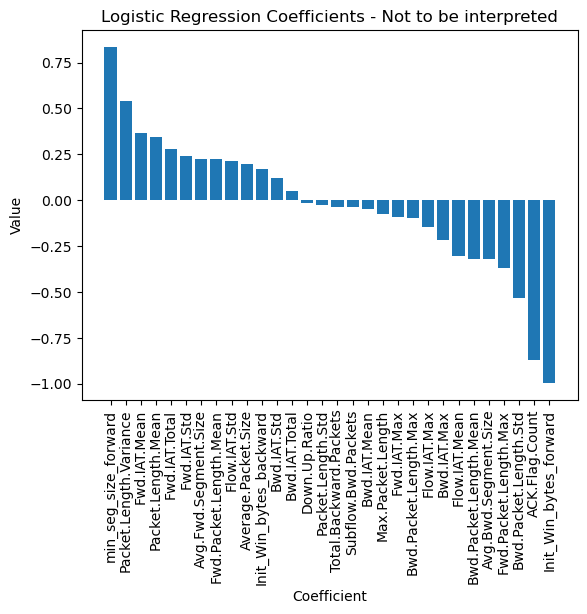

In [17]:
coefficients = lr_corr.coef_[0]

# Generate labels for the coefficients
labels = top_30_features_by_iqr.to_list()

# combine labels and coefs
sorted_indices = np.argsort(coefficients)[::-1]
sorted_coefficients = coefficients[sorted_indices]
sorted_labels = np.array(labels)[sorted_indices]

# Plotting the coefficients as a bar chart
plt.bar(sorted_labels, sorted_coefficients)

# Rotating the x-axis labels for better readability
plt.xticks(rotation=90)

# Adding labels and title to the plot
plt.xlabel('Coefficient')
plt.ylabel('Value')
plt.title('Logistic Regression Coefficients - Not to be interpreted')

# Display the plot
plt.show()

**<span style="color:red">NOTE: IMPORTANT: These coefficients should not be interpreted in any way, since we have arbitrarily chosen some numbers for output class</span>**

## 7. Decision Tree

In [18]:
def decisiontree(Xtrain, ytrain):
    dt = DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)
    dt.fit(Xtrain, ytrain)
    return dt

In [19]:
# PCA dataset
dt = decisiontree(X_train_pca, y_train)

In [20]:
# IQR data
dt_corr = decisiontree(X_train_corr, y_train_corr)

In [21]:
dt_pred = dt.predict(X_test_pca)
print('Accuracy in DecisionTree on PCA Dataset', dt.score(X_test_pca, y_test))
dt_corr_pred = dt_corr.predict(X_test_corr)
print('Accuracy in DecisionTree on Feature Selection via IQR', dt_corr.score(X_test_corr, y_test_corr))

Accuracy in DecisionTree on PCA Dataset 0.1645632204845299
Accuracy in DecisionTree on Feature Selection via IQR 0.1844440396575503


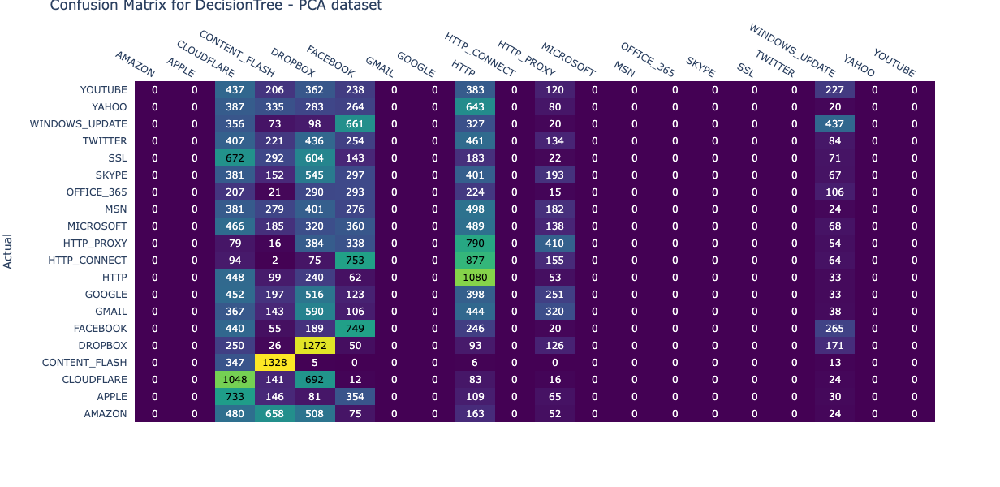

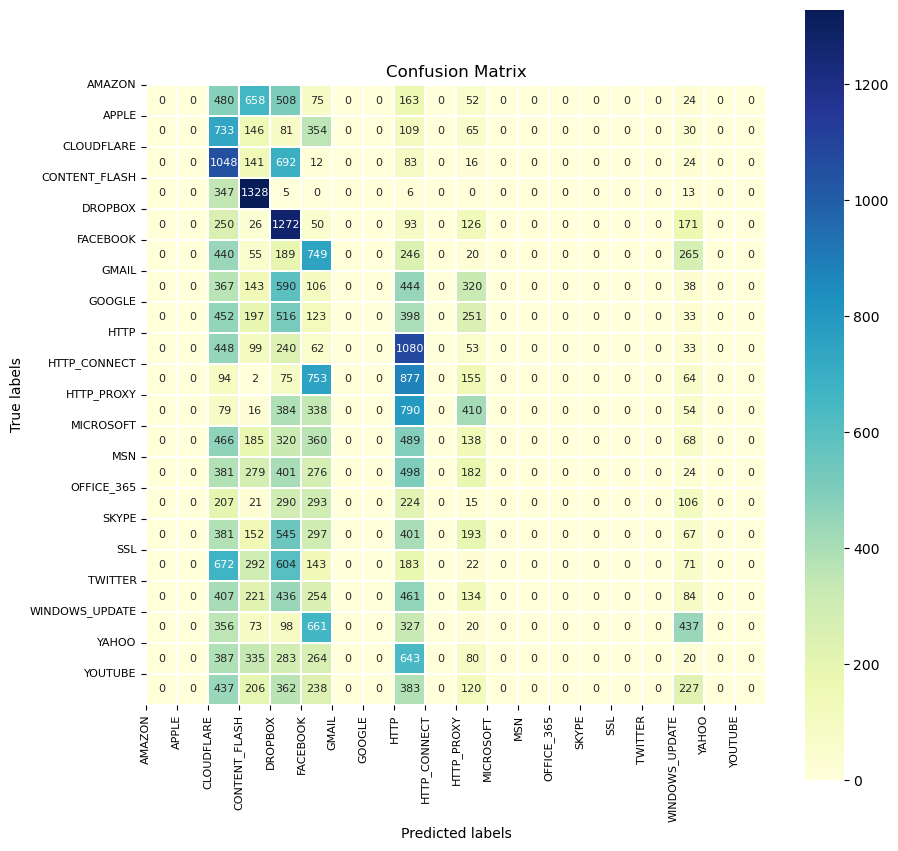

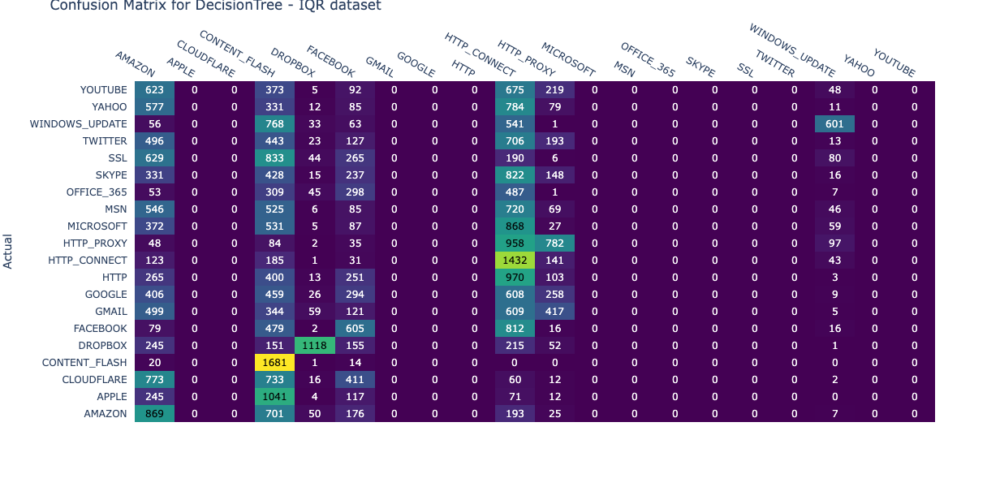

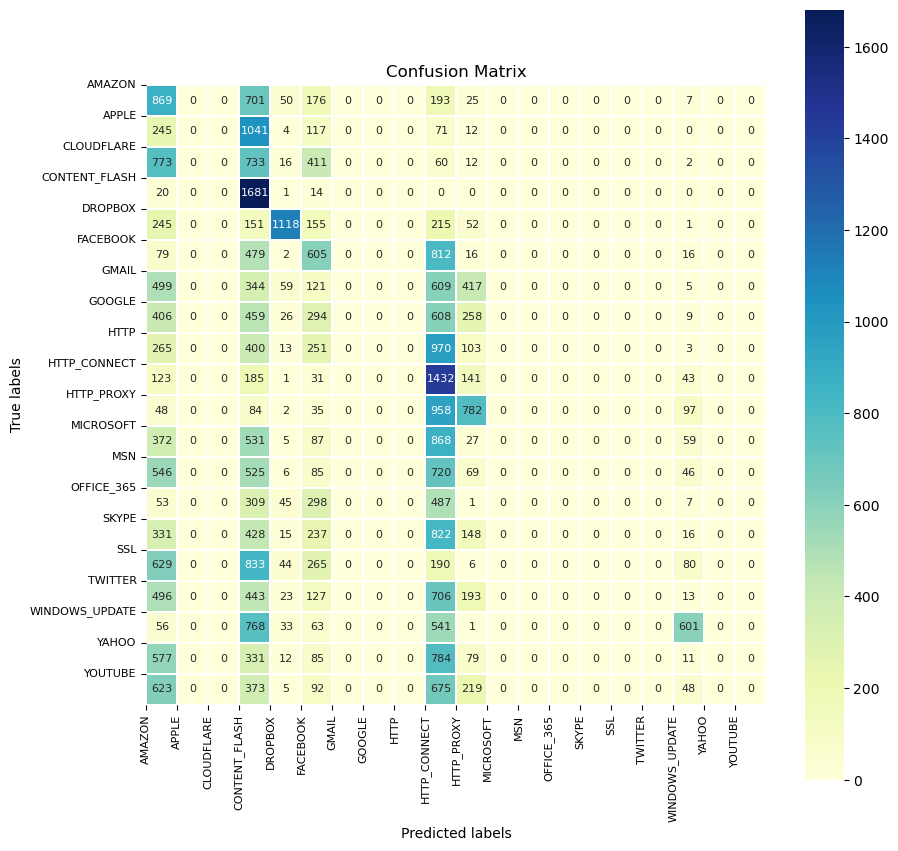

In [22]:
draw_confusion_matrix(y_test, dt_pred, 'DecisionTree - PCA dataset', 'dt-pca')
draw_confusion_matrix(y_test_corr, dt_corr_pred, 'DecisionTree - IQR dataset', 'dt-corr')

In [23]:
draw_classification_report(y_test, dt_pred, 'DecisionTree - PCA dataset')
draw_classification_report(y_test_corr, dt_corr_pred, 'DecisionTree - IQR dataset')

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
AMAZON,0.000000,0.000000,0.000000,1960.000000
APPLE,0.000000,0.000000,0.000000,1518.000000
CLOUDFLARE,0.124288,0.519841,0.200613,2016.000000
CONTENT_FLASH,0.290273,0.781636,0.423334,1699.000000
DROPBOX,0.161196,0.639839,0.257516,1988.000000
FACEBOOK,0.138499,0.381365,0.203201,1964.000000
GMAIL,0.000000,0.000000,0.000000,2008.000000
GOOGLE,0.000000,0.000000,0.000000,1970.000000
HTTP,0.136743,0.535980,0.217896,2015.000000
HTTP_CONNECT,0.000000,0.000000,0.000000,2020.000000


/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/venkit/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
AMAZON,0.119779,0.429985,0.187365,2021.000000
APPLE,0.000000,0.000000,0.000000,1490.000000
CLOUDFLARE,0.000000,0.000000,0.000000,2007.000000
CONTENT_FLASH,0.155663,0.979604,0.268638,1716.000000
DROPBOX,0.755405,0.577181,0.654375,1937.000000
FACEBOOK,0.170471,0.301145,0.217704,2009.000000
GMAIL,0.000000,0.000000,0.000000,2054.000000
GOOGLE,0.000000,0.000000,0.000000,2060.000000
HTTP,0.000000,0.000000,0.000000,2005.000000
HTTP_CONNECT,0.122174,0.732106,0.209403,1956.000000


**NOTE:**
- **The above warnings are expected because Decision Tree is unable to predict some value and hence they remain 0**

### 7.1 Decision Tree Feature Importance

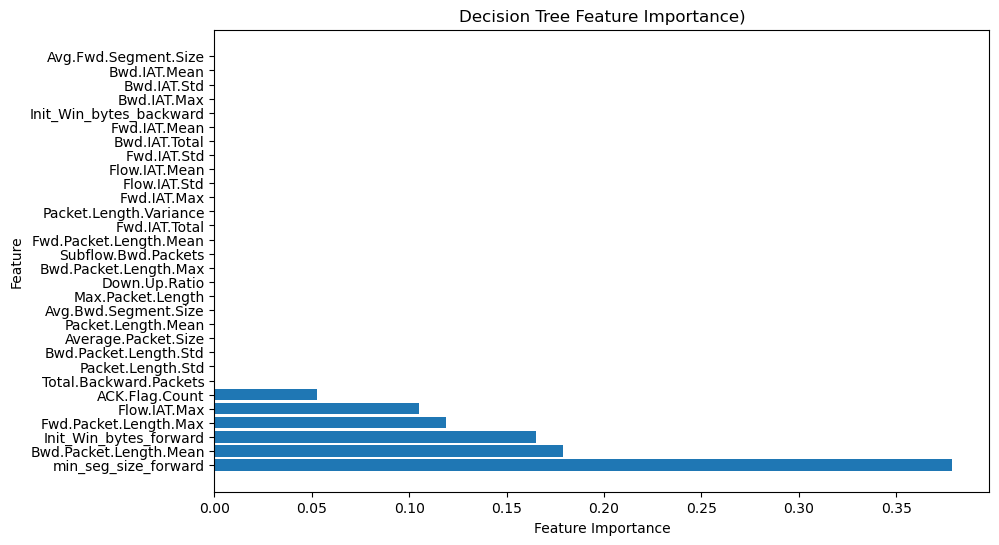

In [24]:
import matplotlib.pyplot as plt

# Create a list of feature names from the dataset
feature_names = top_30_features_by_iqr.to_list()

# Get feature importances from the model
feature_importances = dt_corr.feature_importances_

# Sort features and their importances in descending order
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_names = [feature_names[i] for i in sorted_indices]
sorted_feature_importances = feature_importances[sorted_indices]

# Create a bar plot for feature importance
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_feature_names)), sorted_feature_importances, align='center')
plt.yticks(range(len(sorted_feature_names)), sorted_feature_names)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Decision Tree Feature Importance)')
plt.show()

### 7.2 Decision Tree SHAP (SHapley Additive exPlanations)

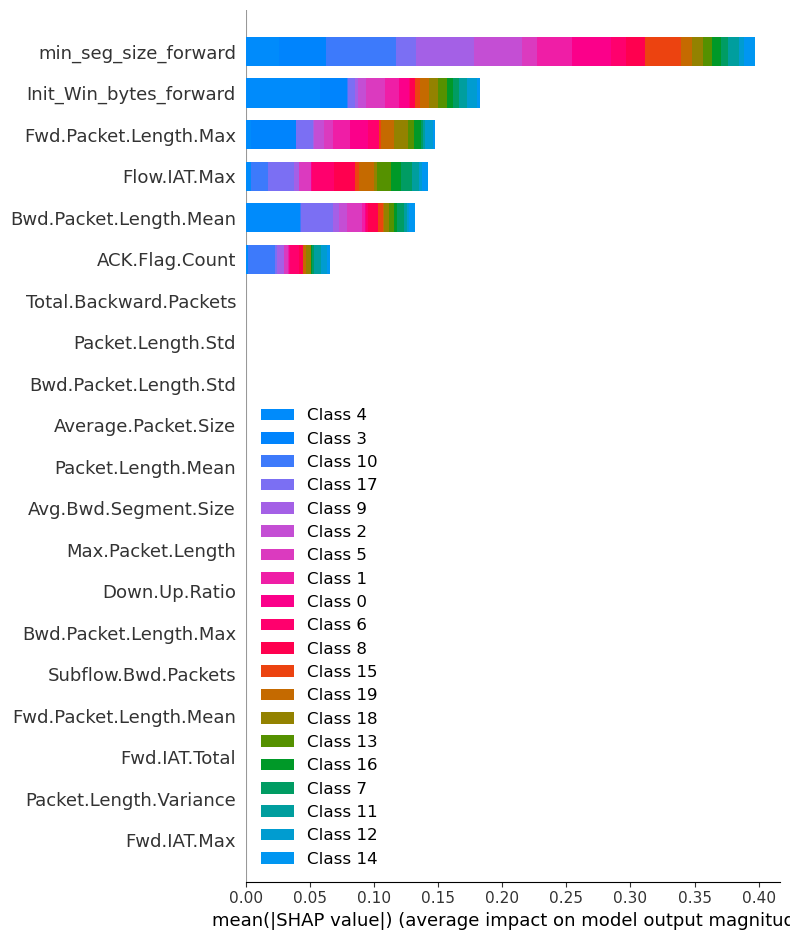

In [25]:
import shap

shap_values = shap.TreeExplainer(dt_corr).shap_values(X_test_corr)
shap.summary_plot(shap_values, X_test_corr, feature_names=top_30_features_by_iqr.to_list())

### 7.3 Interpretation of Feature Importance and SHAP

Both Feature Importance and SHAP seems to agree upon the following attributes as contributing more

- min_seg_size_forward (highest contribution)
- Init_Win_bytes_forward
- Bwd.Packet.Length.Mean
- Flow.IAT.Max
- Ack.Flag.Count
- Fwd.Packet.Length.Max

## 8. SVM

In [26]:
def svmfit(Xtrain, ytrain):
    svm = SVC(kernel='rbf', random_state=42)
    svm.fit(Xtrain, ytrain)
    return svm

In [27]:
# PCA dataset
svm = svmfit(X_train_pca, y_train)

In [28]:
# IQR data
svm_corr = svmfit(X_train_corr, y_train_corr)

In [29]:
svm_pred = svm.predict(X_test_pca)
print('Accuracy in SVM on PCA Dataset', svm.score(X_test_pca, y_test))
svm_corr_pred = svm_corr.predict(X_test_corr)
print('Accuracy in SVM on Feature Selection via IQR', svm_corr.score(X_test_corr, y_test_corr))

Accuracy in SVM on PCA Dataset 0.33966535689193056
Accuracy in SVM on Feature Selection via IQR 0.42145254885633243


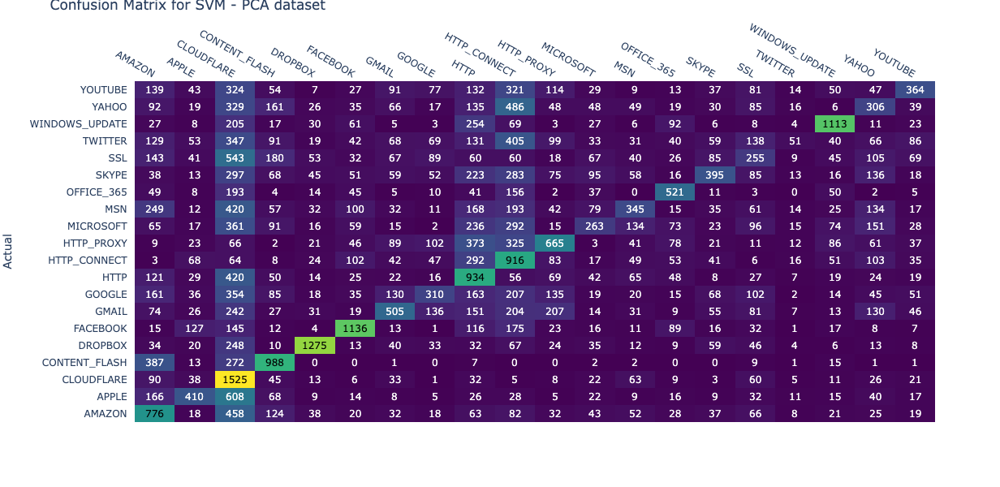

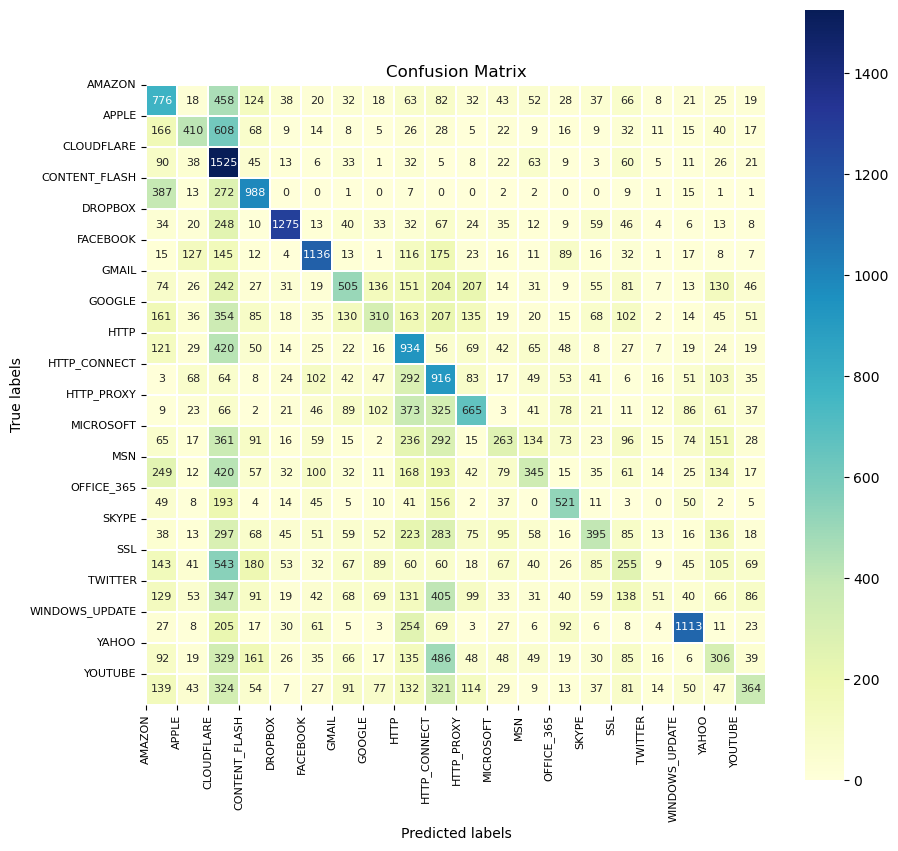

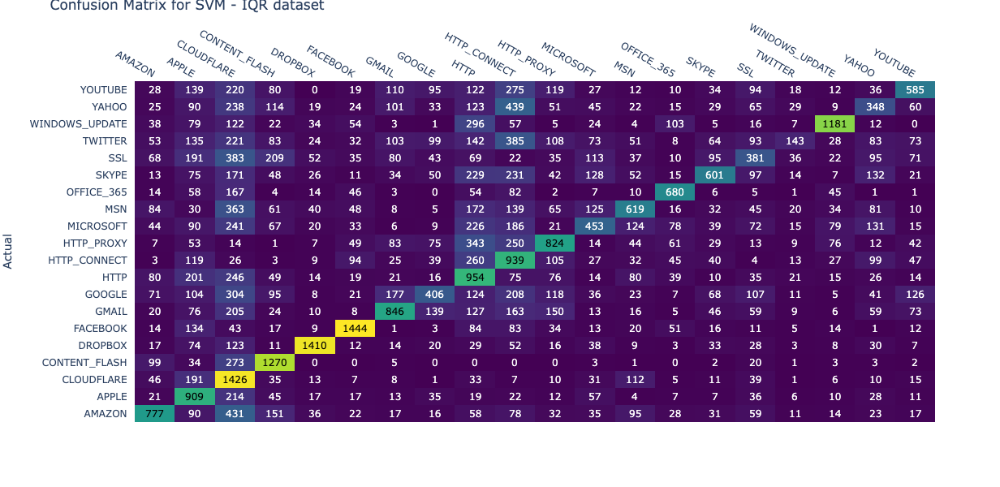

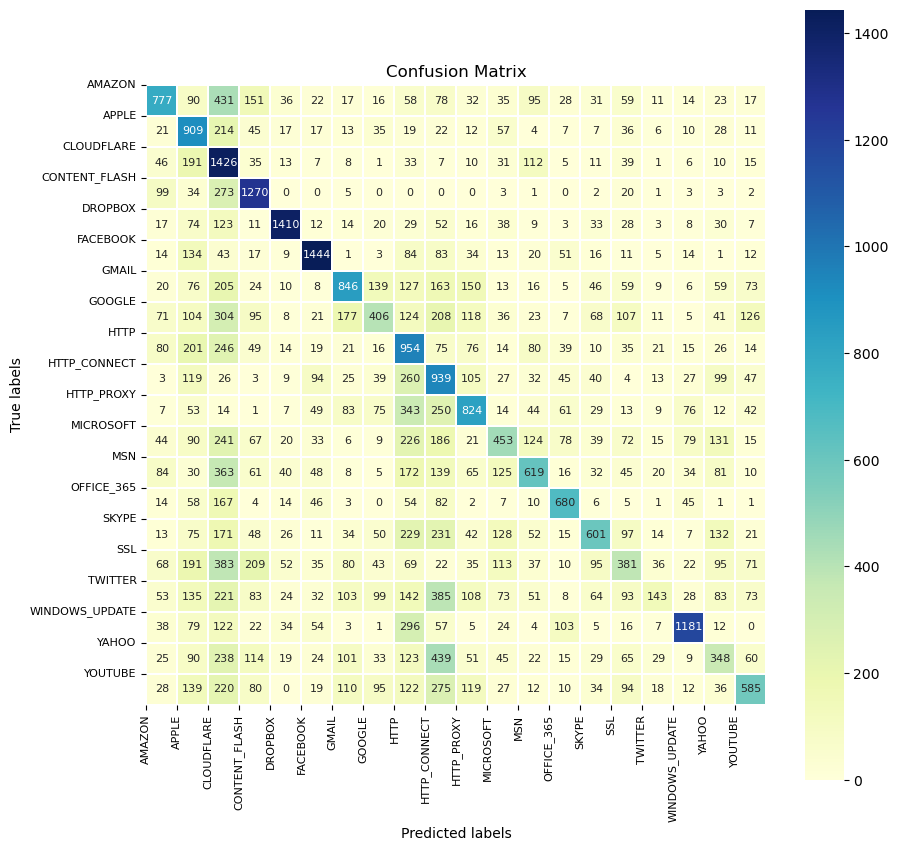

,precision,recall,f1-score,support
AMAZON,0.280448,0.395918,0.328327,1960.000000
APPLE,0.401174,0.270092,0.322835,1518.000000
CLOUDFLARE,0.205498,0.756448,0.323196,2016.000000
CONTENT_FLASH,0.461251,0.581519,0.514449,1699.000000
DROPBOX,0.754885,0.641348,0.693500,1988.000000
FACEBOOK,0.608137,0.578411,0.592902,1964.000000
GMAIL,0.381708,0.251494,0.303212,2008.000000
GOOGLE,0.310310,0.157360,0.208825,1970.000000
HTTP,0.261698,0.463524,0.334527,2015.000000
HTTP_CONNECT,0.211547,0.453465,0.288504,2020.000000


,precision,recall,f1-score,support
AMAZON,0.510512,0.384463,0.438611,2021.000000
APPLE,0.316504,0.610067,0.416781,1490.000000
CLOUDFLARE,0.262567,0.710513,0.383436,2007.000000
CONTENT_FLASH,0.531603,0.740093,0.618758,1716.000000
DROPBOX,0.800227,0.727930,0.762368,1937.000000
FACEBOOK,0.723810,0.718766,0.721279,2009.000000
GMAIL,0.510253,0.411879,0.455819,2054.000000
GOOGLE,0.374194,0.197087,0.258188,2060.000000
HTTP,0.275404,0.475810,0.348875,2005.000000
HTTP_CONNECT,0.254265,0.480061,0.332448,1956.000000


In [30]:
draw_confusion_matrix(y_test, svm_pred, 'SVM - PCA dataset', 'svm-pca')
draw_confusion_matrix(y_test_corr, svm_corr_pred, 'SVM - IQR dataset', 'svm-corr')

draw_classification_report(y_test, svm_pred, 'SVM - PCA dataset')
draw_classification_report(y_test_corr, svm_corr_pred, 'SVM - IQR dataset')

## 9. KNN

In [31]:
def knnfit(Xtrain, ytrain):
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(Xtrain, ytrain)
    return knn

In [32]:
# PCA dataset
knn = knnfit(X_train_pca, y_train)

In [33]:
# IQR data
knn_corr = knnfit(X_train_corr, y_train_corr)

In [34]:
knn_pred = knn.predict(X_test_pca)
print('Accuracy in KNN on PCA Dataset', knn.score(X_test_pca, y_test))
knn_corr_pred = knn_corr.predict(X_test_corr)
print('Accuracy in KNN on Feature Selection via IQR', knn_corr.score(X_test_corr, y_test_corr))

Accuracy in KNN on PCA Dataset 0.5037601811132217
Accuracy in KNN on Feature Selection via IQR 0.5767259101199614


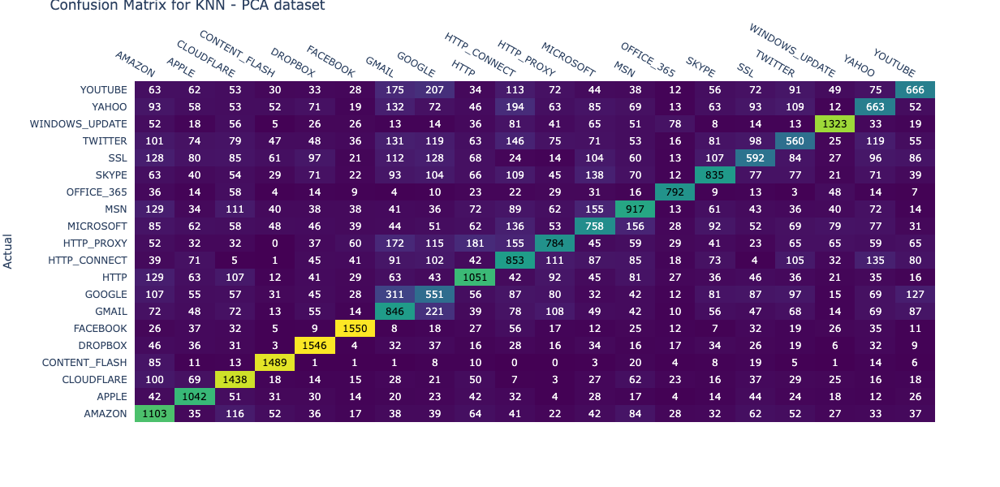

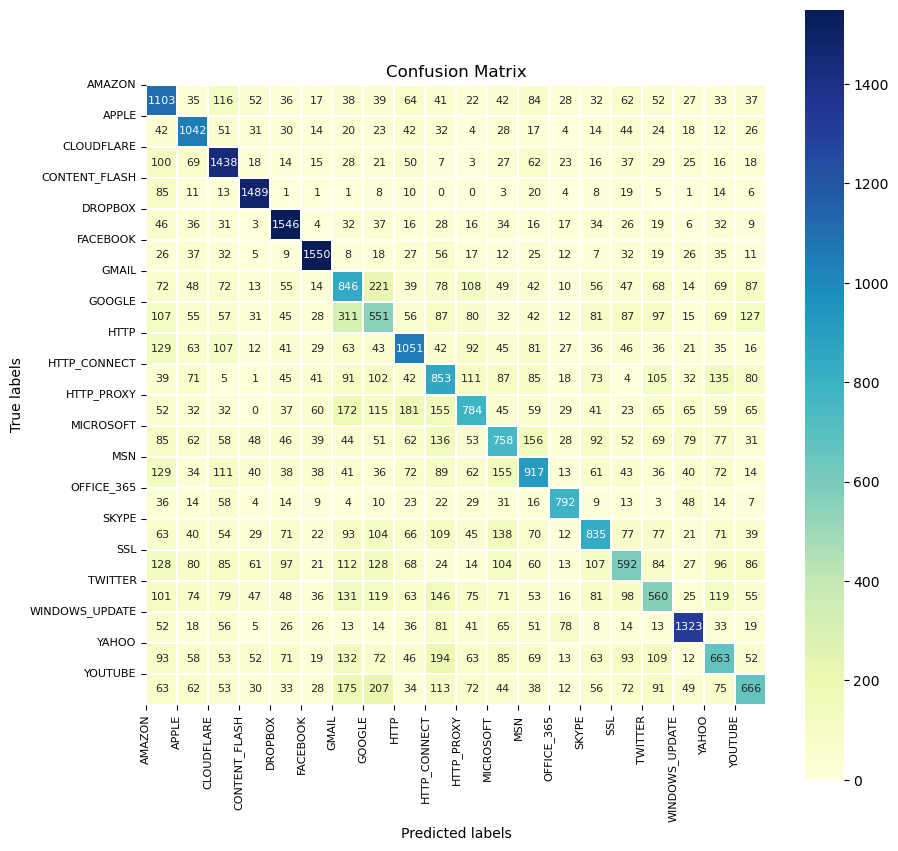

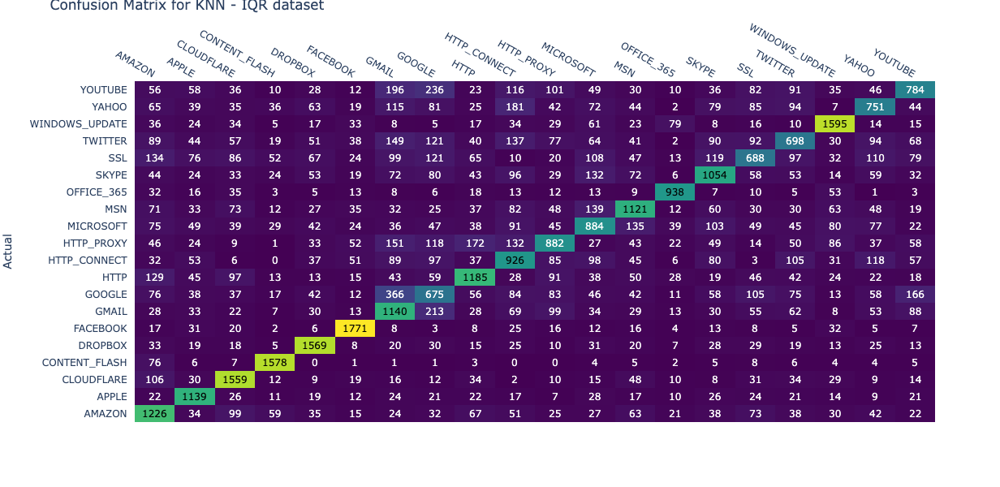

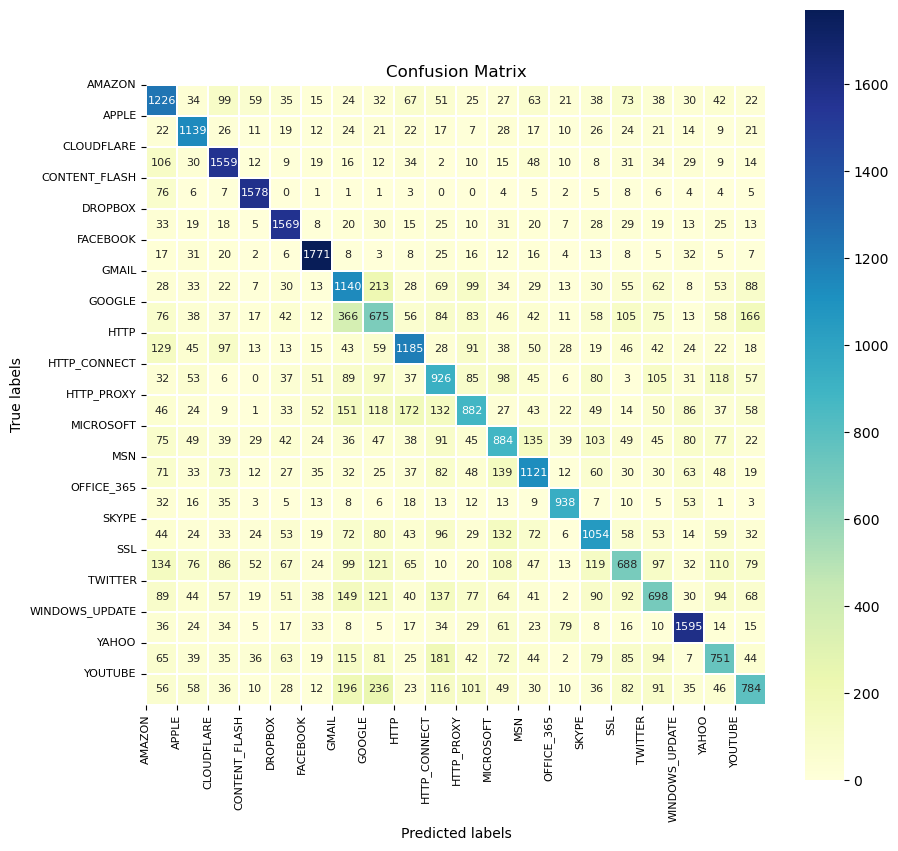

,precision,recall,f1-score,support
AMAZON,0.432379,0.562755,0.489027,1960.000000
APPLE,0.536837,0.686430,0.602486,1518.000000
CLOUDFLARE,0.561499,0.713294,0.628359,2016.000000
CONTENT_FLASH,0.755454,0.876398,0.811444,1699.000000
DROPBOX,0.671298,0.777666,0.720578,1988.000000
FACEBOOK,0.770761,0.789206,0.779874,1964.000000
GMAIL,0.359236,0.421315,0.387807,2008.000000
GOOGLE,0.287129,0.279695,0.283363,1970.000000
HTTP,0.513184,0.521588,0.517352,2015.000000
HTTP_CONNECT,0.372002,0.422277,0.395548,2020.000000


,precision,recall,f1-score,support
AMAZON,0.512328,0.606630,0.555505,2021.000000
APPLE,0.627548,0.764430,0.689259,1490.000000
CLOUDFLARE,0.669674,0.776781,0.719262,2007.000000
CONTENT_FLASH,0.832718,0.919580,0.873996,1716.000000
DROPBOX,0.731128,0.810015,0.768553,1937.000000
FACEBOOK,0.810156,0.881533,0.844338,2009.000000
GMAIL,0.438968,0.555015,0.490217,2054.000000
GOOGLE,0.340393,0.327670,0.333910,2060.000000
HTTP,0.613037,0.591022,0.601828,2005.000000
HTTP_CONNECT,0.436999,0.473415,0.454479,1956.000000


In [35]:
draw_confusion_matrix(y_test, knn_pred, 'KNN - PCA dataset', 'knn-pca')
draw_confusion_matrix(y_test_corr, knn_corr_pred, 'KNN - IQR dataset', 'knn-corr')

draw_classification_report(y_test, knn_pred, 'KNN - PCA dataset')
draw_classification_report(y_test_corr, knn_corr_pred, 'KNN - IQR dataset')

## 10. Naive Bayes

In [36]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

def nb_fit(Xtrain, ytrain):
    nb = GaussianNB()
    nb.fit(Xtrain, ytrain)
    return nb

In [37]:
# PCA dataset
nb = nb_fit(X_train_pca, y_train)

In [38]:
# IQR data
nb_corr = nb_fit(X_train_corr, y_train_corr)

In [39]:
nb_pred = nb.predict(X_test_pca)
print('Accuracy in NaiveBayes on PCA Dataset', nb.score(X_test_pca, y_test))
nb_corr_pred = nb_corr.predict(X_test_corr)
print('Accuracy in NaiveBayes on Feature Selection via IQR', nb_corr.score(X_test_corr, y_test_corr))

Accuracy in NaiveBayes on PCA Dataset 0.1758307528168831
Accuracy in NaiveBayes on Feature Selection via IQR 0.2007338208124073


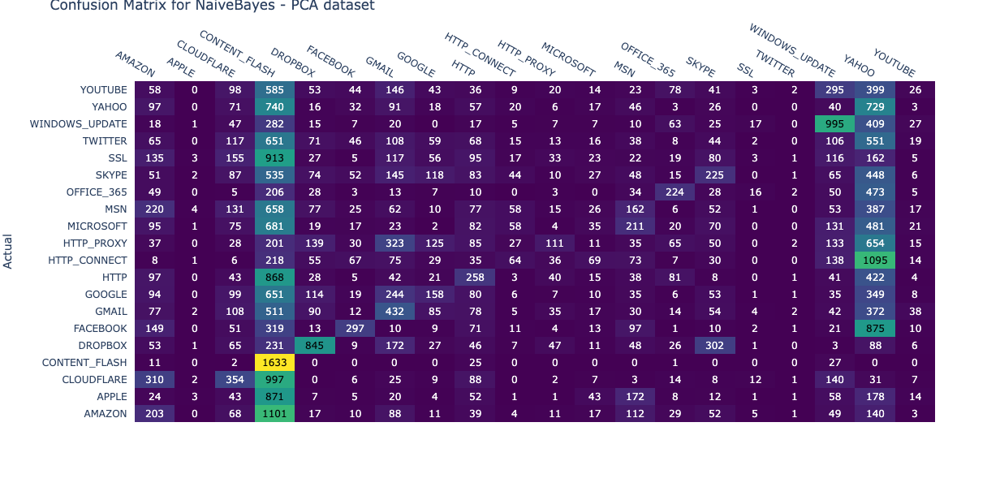

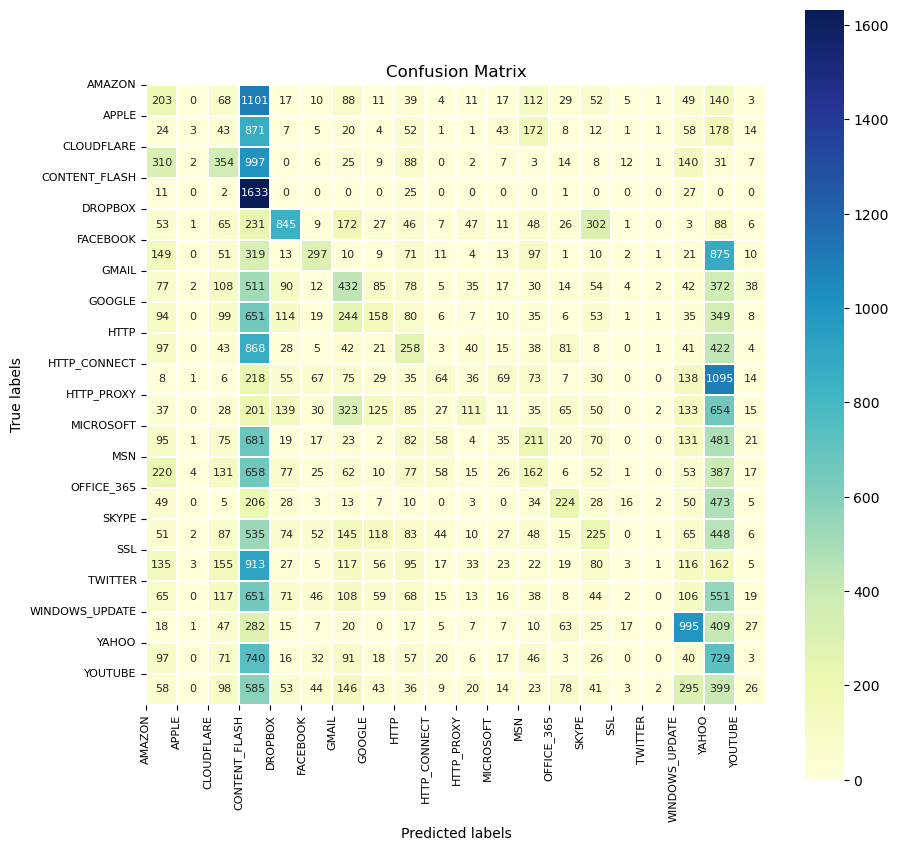

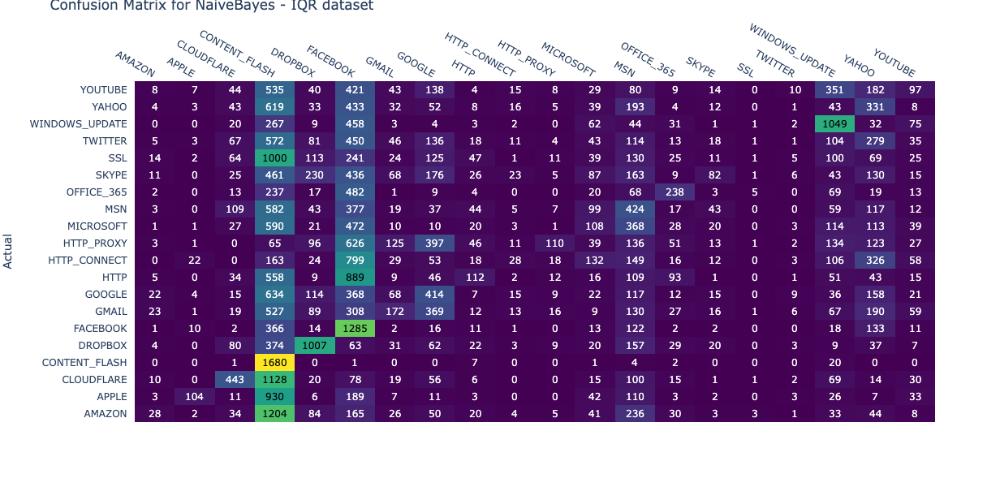

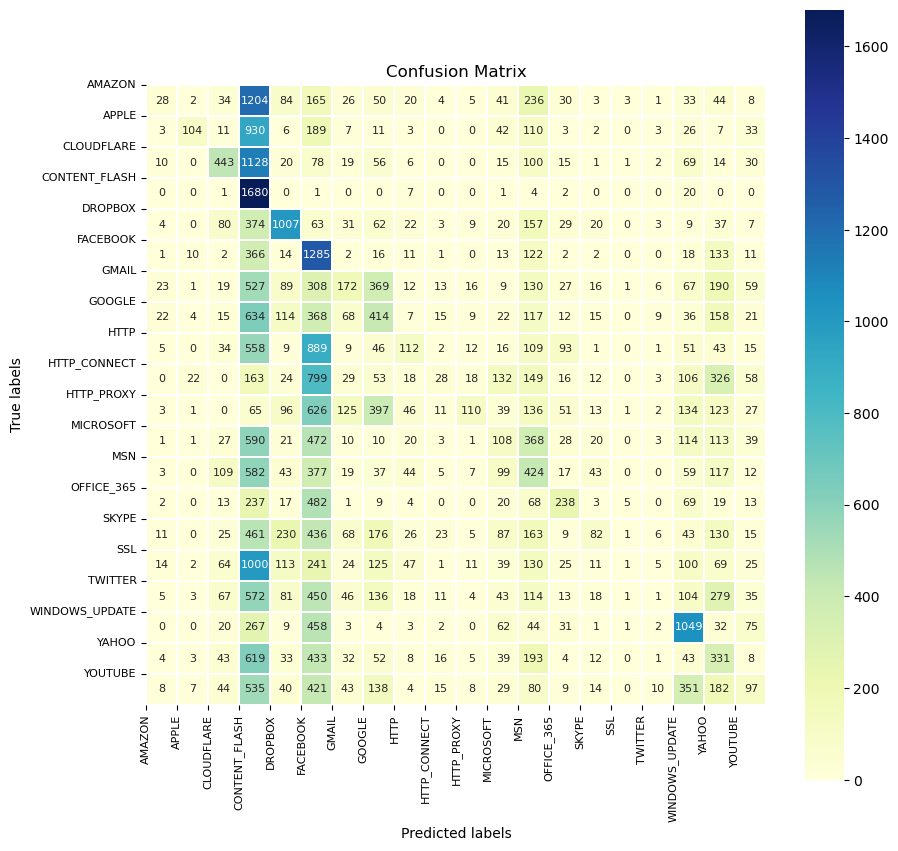

,precision,recall,f1-score,support
AMAZON,0.109670,0.103571,0.106534,1960.000000
APPLE,0.150000,0.001976,0.003901,1518.000000
CLOUDFLARE,0.214156,0.175595,0.192968,2016.000000
CONTENT_FLASH,0.127062,0.961154,0.224452,1699.000000
DROPBOX,0.500592,0.425050,0.459739,1988.000000
FACEBOOK,0.429812,0.151222,0.223729,1964.000000
GMAIL,0.200371,0.215139,0.207493,2008.000000
GOOGLE,0.199747,0.080203,0.114451,1970.000000
HTTP,0.186686,0.128040,0.151899,2015.000000
HTTP_CONNECT,0.180791,0.031683,0.053917,2020.000000


,precision,recall,f1-score,support
AMAZON,0.190476,0.013855,0.025830,2021.000000
APPLE,0.650000,0.069799,0.126061,1490.000000
CLOUDFLARE,0.421503,0.220727,0.289732,2007.000000
CONTENT_FLASH,0.134486,0.979021,0.236486,1716.000000
DROPBOX,0.491220,0.519876,0.505142,1937.000000
FACEBOOK,0.150451,0.639622,0.243602,2009.000000
GMAIL,0.234332,0.083739,0.123386,2054.000000
GOOGLE,0.191578,0.200971,0.196162,2060.000000
HTTP,0.255708,0.055860,0.091691,2005.000000
HTTP_CONNECT,0.183007,0.014315,0.026553,1956.000000


In [40]:
draw_confusion_matrix(y_test, nb_pred, 'NaiveBayes - PCA dataset', 'nb-pca')
draw_confusion_matrix(y_test_corr, nb_corr_pred, 'NaiveBayes - IQR dataset', 'nb-corr')

draw_classification_report(y_test, nb_pred, 'NaiveBayes - PCA dataset')
draw_classification_report(y_test_corr, nb_corr_pred, 'NaiveBayes - IQR dataset')

## 11. Random Forest Classifier

In [41]:
from sklearn.ensemble import RandomForestClassifier

def random_forest_fit(Xtrain, ytrain):
    rf = RandomForestClassifier(n_estimators=200)
    rf.fit(Xtrain, ytrain)
    return rf

In [42]:
# PCA dataset
rf = random_forest_fit(X_train_pca, y_train)

In [43]:
# IQR data
rf_corr = random_forest_fit(X_train_corr, y_train_corr)

In [44]:
rf_pred = rf.predict(X_test_pca)
print('Accuracy in RandomForest on PCA Dataset', rf.score(X_test_pca, y_test))
rf_corr_pred = rf_corr.predict(X_test_corr)
print('Accuracy in RandomForest on Feature Selection via IQR', rf_corr.score(X_test_corr, y_test_corr))

Accuracy in RandomForest on PCA Dataset 0.5434957974446382
Accuracy in RandomForest on Feature Selection via IQR 0.673657914595748


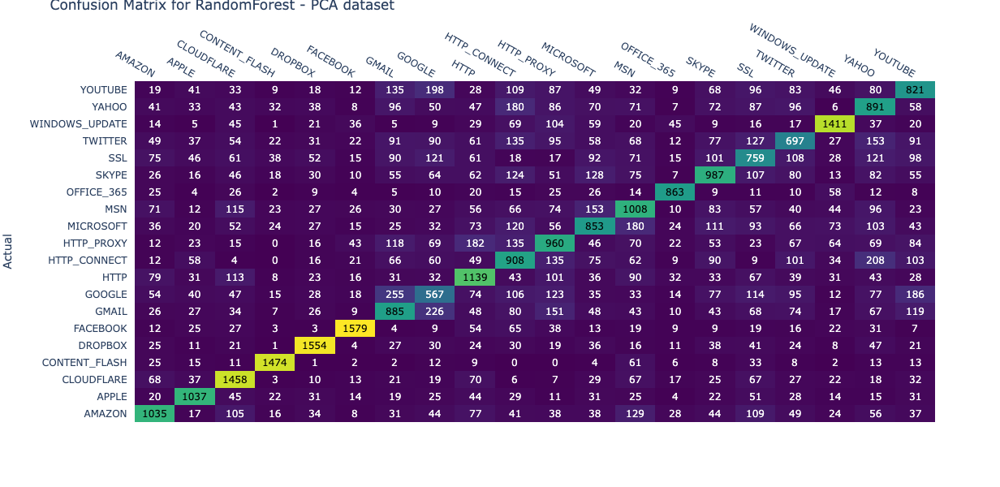

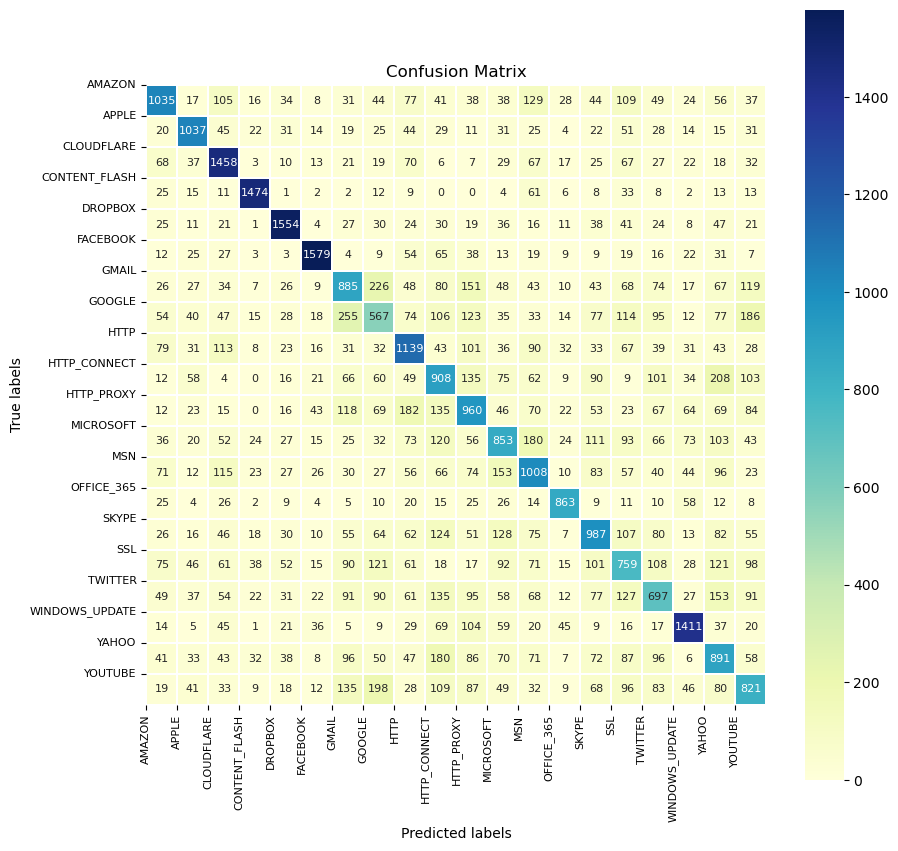

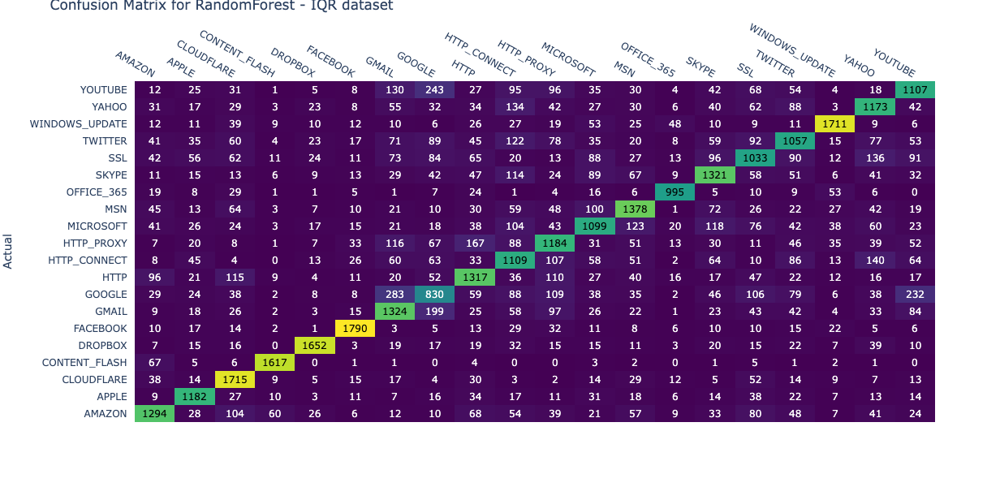

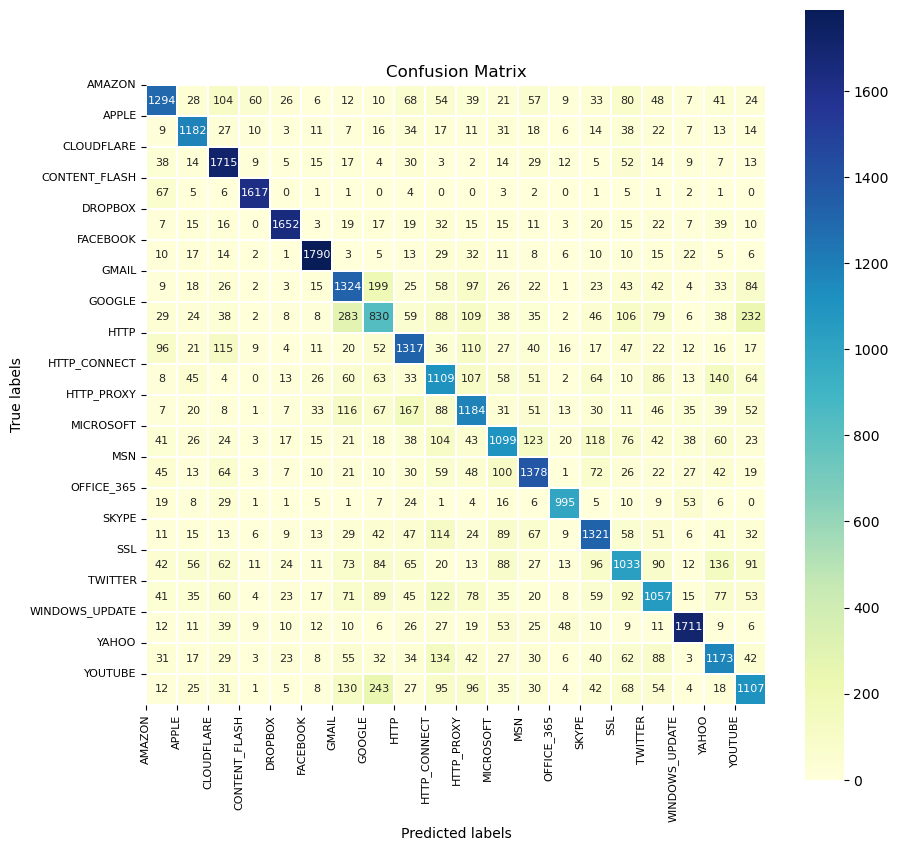

,precision,recall,f1-score,support
AMAZON,0.600348,0.528061,0.561889,1960.000000
APPLE,0.675570,0.683136,0.679332,1518.000000
CLOUDFLARE,0.619108,0.723214,0.667124,2016.000000
CONTENT_FLASH,0.857974,0.867569,0.862745,1699.000000
DROPBOX,0.778947,0.781690,0.780316,1988.000000
FACEBOOK,0.842133,0.803971,0.822610,1964.000000
GMAIL,0.444500,0.440737,0.442611,2008.000000
GOOGLE,0.334711,0.287817,0.309498,1970.000000
HTTP,0.516085,0.565261,0.539555,2015.000000
HTTP_CONNECT,0.398420,0.449505,0.422424,2020.000000


,precision,recall,f1-score,support
AMAZON,0.707877,0.640277,0.672382,2021.000000
APPLE,0.741066,0.793289,0.766288,1490.000000
CLOUDFLARE,0.707508,0.854509,0.774092,2007.000000
CONTENT_FLASH,0.922419,0.942308,0.932257,1716.000000
DROPBOX,0.897338,0.852865,0.874537,1937.000000
FACEBOOK,0.887017,0.890991,0.888999,2009.000000
GMAIL,0.582490,0.644596,0.611971,2054.000000
GOOGLE,0.462653,0.402913,0.430721,2060.000000
HTTP,0.625653,0.656858,0.640876,2005.000000
HTTP_CONNECT,0.506393,0.566973,0.534973,1956.000000


In [45]:
draw_confusion_matrix(y_test, rf_pred, 'RandomForest - PCA dataset', 'rfc-pca')
draw_confusion_matrix(y_test_corr, rf_corr_pred, 'RandomForest - IQR dataset', 'rfc-corr')

draw_classification_report(y_test, rf_pred, 'RandomForest - PCA dataset')
draw_classification_report(y_test_corr, rf_corr_pred, 'RandomForest - IQR dataset')

### 11.1 Random Forest Feature Importance

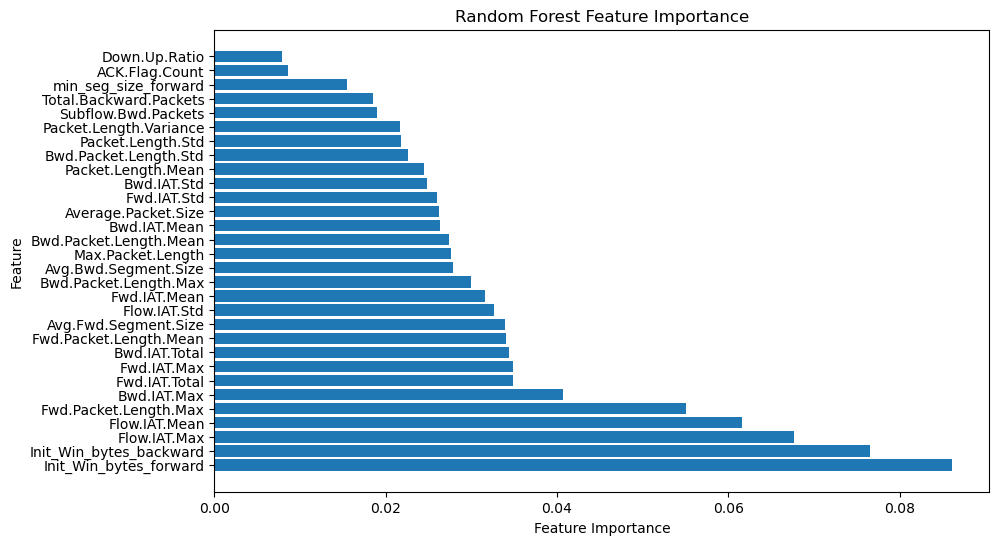

In [46]:
feature_names = top_30_features_by_iqr.to_list()

# Get feature importances from the model
feature_importances = rf_corr.feature_importances_

# Sort features and their importances in descending order
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_names = [feature_names[i] for i in sorted_indices]
sorted_feature_importances = feature_importances[sorted_indices]

# Create a bar plot for feature importance
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_feature_names)), sorted_feature_importances, align='center')
plt.yticks(range(len(sorted_feature_names)), sorted_feature_names)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importance')
plt.show()


### 11.2 Interpretation of Feature Importance

Top-5 features by importance

- Init_Win_bytes_forward
- Init_Win_bytes_backward
- Flow.IAT.Max
- Flow.IAT.Mean
- Fwd.Packet.Length.Max


## 12. XGBoost

In [47]:
import xgboost as xgb

In [48]:
def xgb_fit(Xtrain, ytrain):
    xg = xgb.XGBClassifier(seed=42)
    xg.fit(Xtrain, ytrain)
    return xg

In [49]:
# PCA dataset
xg = xgb_fit(X_train_pca, y_train)

In [50]:
# IQR data
xg_corr = xgb_fit(X_train_corr, y_train_corr)

In [51]:
xg_pred = xg.predict(X_test_pca)
print('Accuracy in XGBoost on PCA Dataset', xg.score(X_test_pca, y_test))
xg_corr_pred = xg_corr.predict(X_test_corr)
print('Accuracy in XGBoost on Feature Selection via IQR', xg_corr.score(X_test_corr, y_test_corr))

Accuracy in XGBoost on PCA Dataset 0.5072731530875121
Accuracy in XGBoost on Feature Selection via IQR 0.6878399125660308


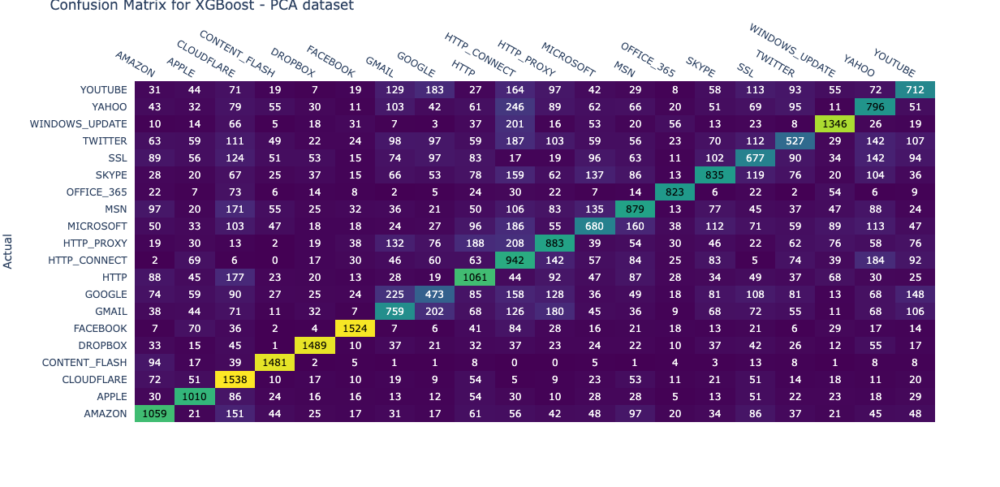

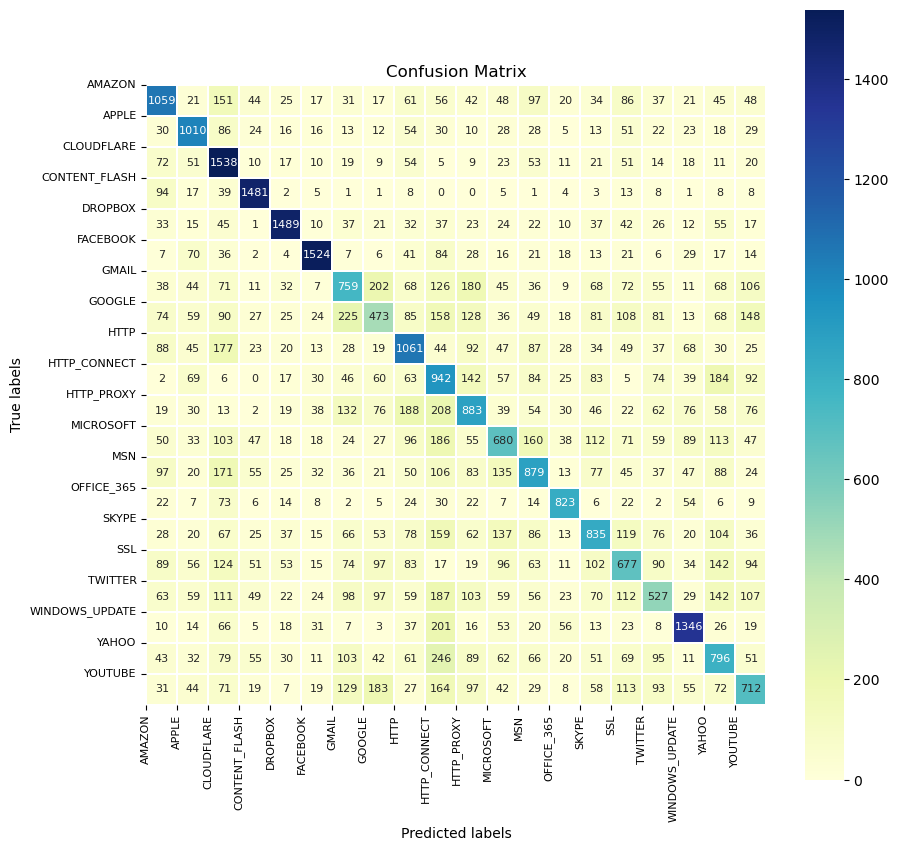

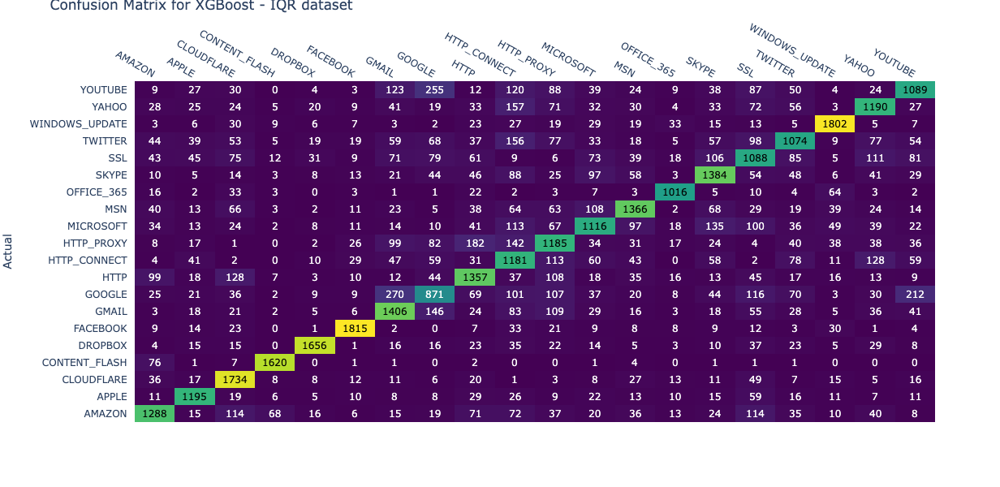

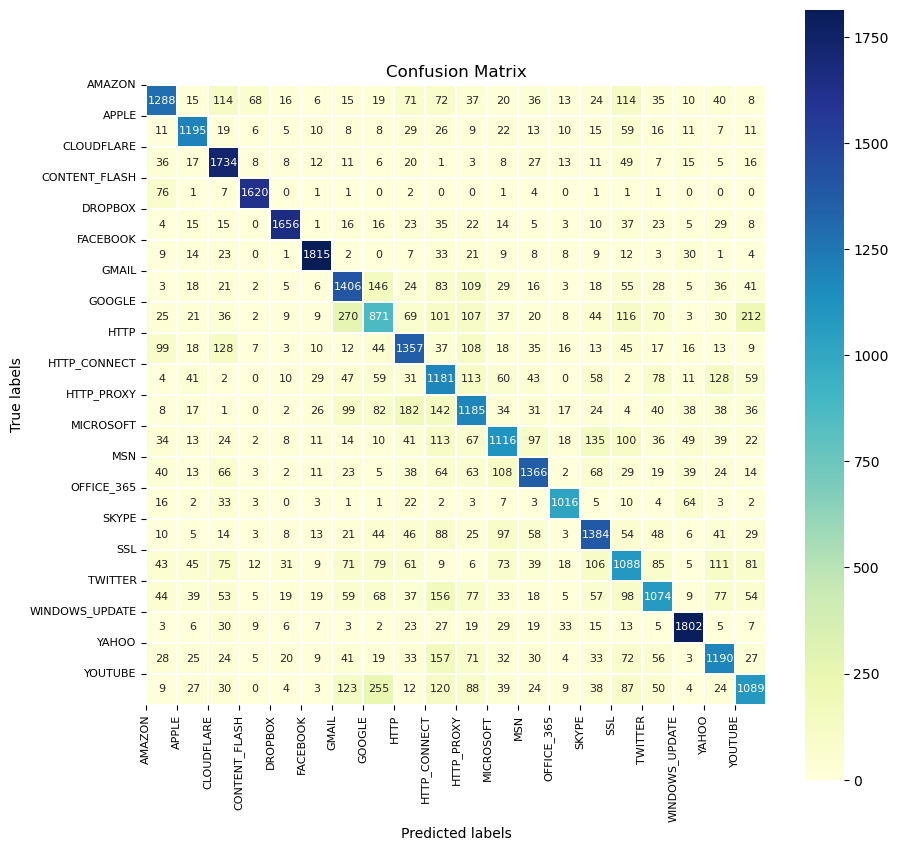

,precision,recall,f1-score,support
AMAZON,0.543356,0.540306,0.541827,1960.000000
APPLE,0.588578,0.665349,0.624613,1518.000000
CLOUDFLARE,0.493423,0.762897,0.599260,2016.000000
CONTENT_FLASH,0.764584,0.871689,0.814631,1699.000000
DROPBOX,0.787831,0.748994,0.767922,1988.000000
FACEBOOK,0.816283,0.775967,0.795615,1964.000000
GMAIL,0.413174,0.377988,0.394798,2008.000000
GOOGLE,0.332163,0.240102,0.278727,1970.000000
HTTP,0.475785,0.526551,0.499882,2015.000000
HTTP_CONNECT,0.315472,0.466337,0.376348,2020.000000


,precision,recall,f1-score,support
AMAZON,0.719553,0.637308,0.675938,2021.000000
APPLE,0.772463,0.802013,0.786961,1490.000000
CLOUDFLARE,0.708044,0.863976,0.778276,2007.000000
CONTENT_FLASH,0.923077,0.944056,0.933449,1716.000000
DROPBOX,0.913403,0.854930,0.883200,1937.000000
FACEBOOK,0.902985,0.903435,0.903210,2009.000000
GMAIL,0.626839,0.684518,0.654410,2054.000000
GOOGLE,0.502307,0.422816,0.459146,2060.000000
HTTP,0.637688,0.676808,0.656666,2005.000000
HTTP_CONNECT,0.482632,0.603783,0.536452,1956.000000


In [52]:
draw_confusion_matrix(y_test, xg_pred, 'XGBoost - PCA dataset', 'xg-pca')
draw_confusion_matrix(y_test_corr, xg_corr_pred, 'XGBoost - IQR dataset', 'xg-corr')

draw_classification_report(y_test, xg_pred, 'XGBoost - PCA dataset')
draw_classification_report(y_test_corr, xg_corr_pred, 'XBBoost - IQR dataset')

### 12.1 XGBoost Feature Importance

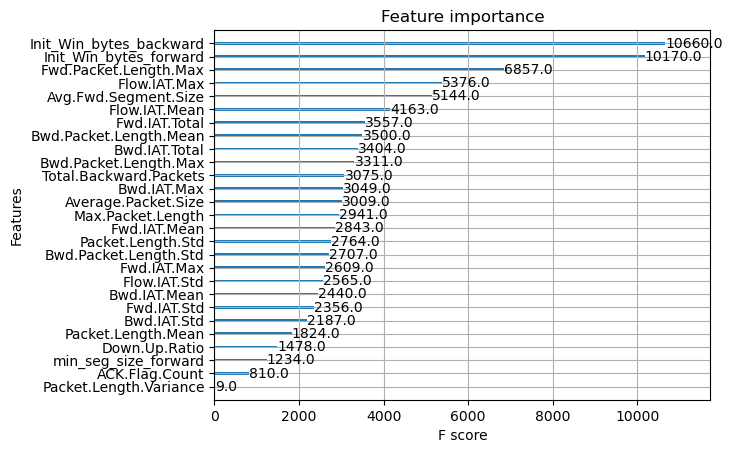

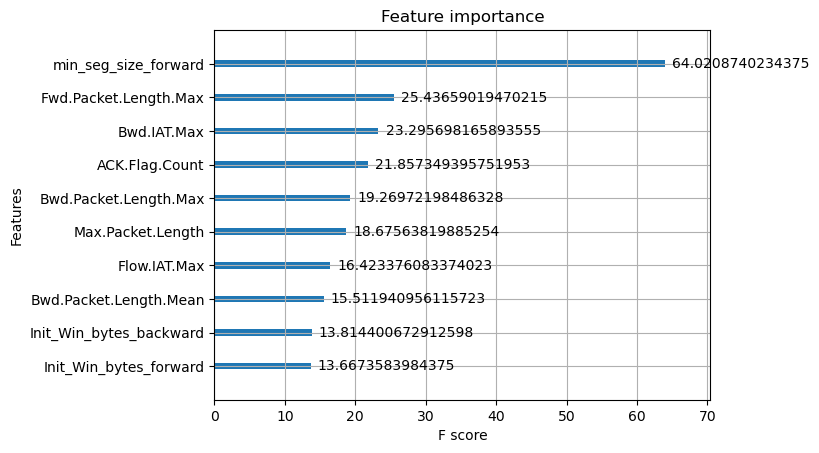

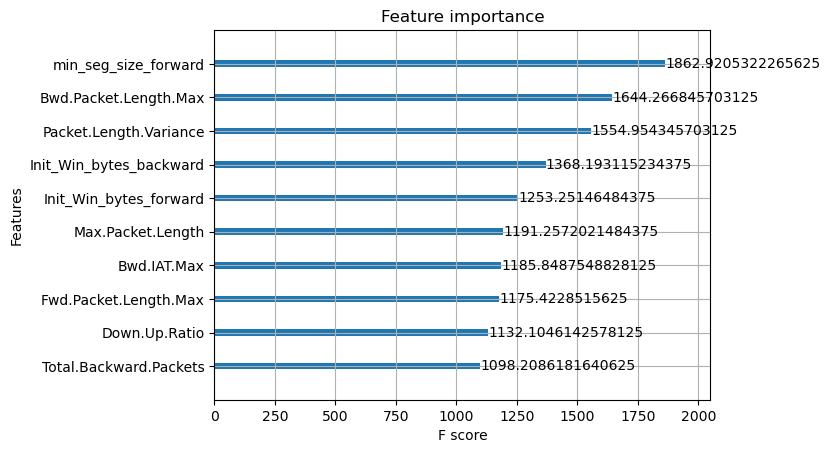

In [53]:
xg_corr.get_booster().feature_names = top_30_features_by_iqr.to_list()
xgb.plot_importance(xg_corr)
plt.show()

# Plot the feature importances
xgb.plot_importance(xg_corr, importance_type ="gain", max_num_features = 10)
plt.show()

# Plot the feature importances
xgb.plot_importance(xg_corr, importance_type ="cover", max_num_features = 10)
plt.show()

In [54]:
xg_corr.feature_importances_

array([0.17187172, 0.05867868, 0.01706248, 0.01870802, 0.02680179,
       0.02761418, 0.03669167, 0.04164367, 0.        , 0.04409052,
       0.05013699, 0.01821061, 0.05173188, 0.06828758, 0.03517875,
       0.        , 0.03005057, 0.03382573, 0.02254687, 0.01454999,
       0.01923426, 0.01519949, 0.03452531, 0.01584624, 0.03708642,
       0.0625401 , 0.01545752, 0.01051571, 0.02191333, 0.        ],
      dtype=float32)

### 12.2 XGBoost SHAP (SHapley Additive exPlanations)

[21:42:29] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_b6b50u1t0e/croot/xgboost-split_1713972723244/work/cpp_src/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


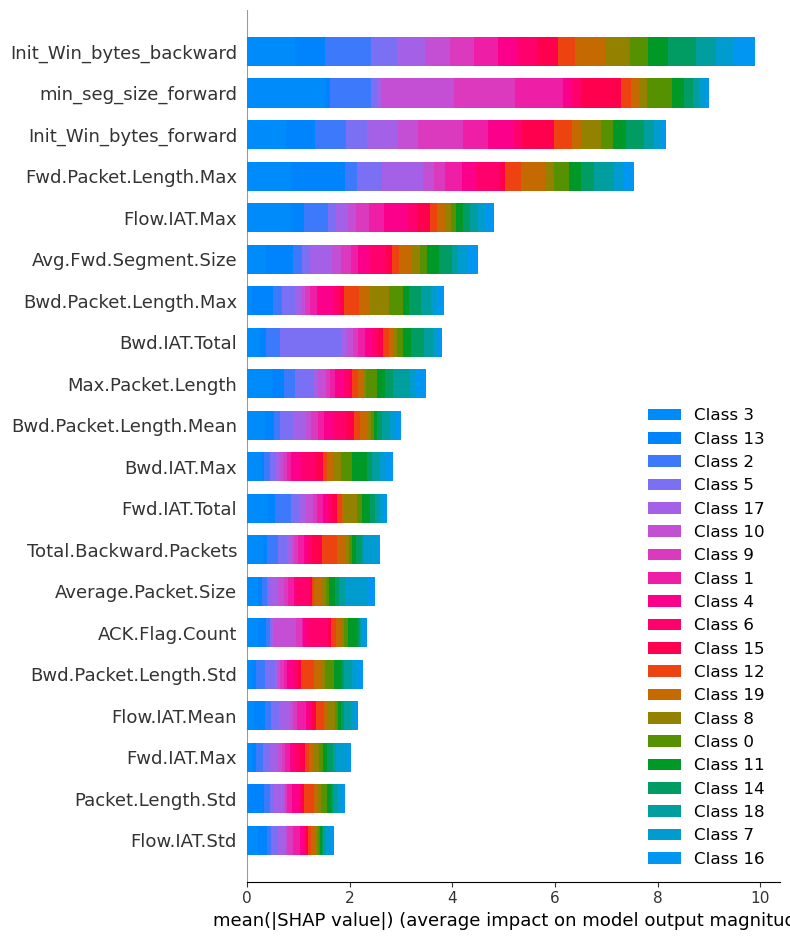

In [55]:
import shap

shap_values = shap.TreeExplainer(xg_corr).shap_values(X_test_corr)
shap.summary_plot(shap_values, X_test_corr, feature_names=top_30_features_by_iqr.to_list())

### 12.3 Interpretation of Feature Importance and SHAP

Top-5 features by SHAP

- Init_Win_bytes_backward
- min_seg_size_forward
- Init_Win_bytes_forward
- Fwd.Packet.Length.Max
- Flow.IAT.Max

Most of the above are also appear at the top in feature importance

## 13. Dummy Classifier Model

In [56]:
from sklearn.dummy import DummyClassifier

def dummy_fit(Xtrain, ytrain):
    dummy = DummyClassifier()
    dummy.fit(Xtrain, ytrain)
    return dummy

In [57]:
# PCA dataset
dummy = dummy_fit(X_train_pca, y_train)

In [58]:
# IQR data
dummy_corr = dummy_fit(X_train_corr, y_train_corr)

In [59]:
dummy_pred = dummy.predict(X_test_pca)
print('Accuracy in Dummy on PCA Dataset', dummy.score(X_test_pca, y_test))
dummy_corr_pred = dummy_corr.predict(X_test_corr)
print('Accuracy in Dummy on Feature Selection via IQR', dummy_corr.score(X_test_corr, y_test_corr))

Accuracy in Dummy on PCA Dataset 0.05100314866376955
Accuracy in Dummy on Feature Selection via IQR 0.0488953654791954


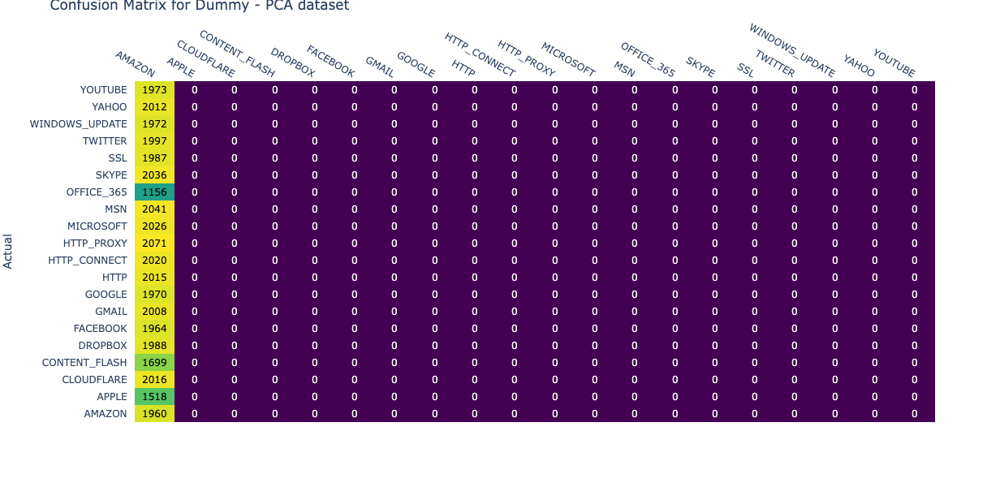

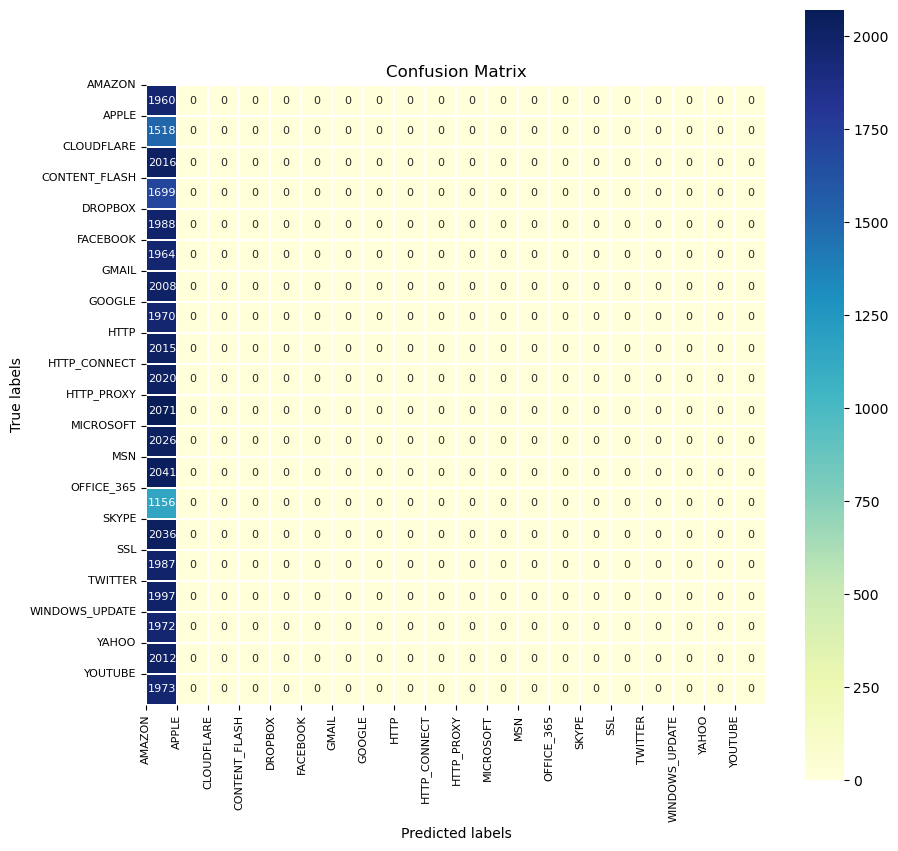

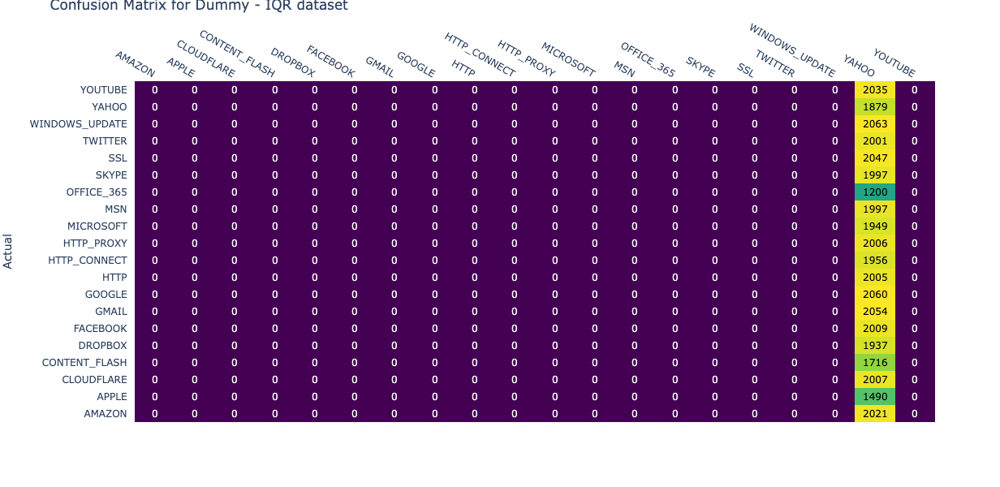

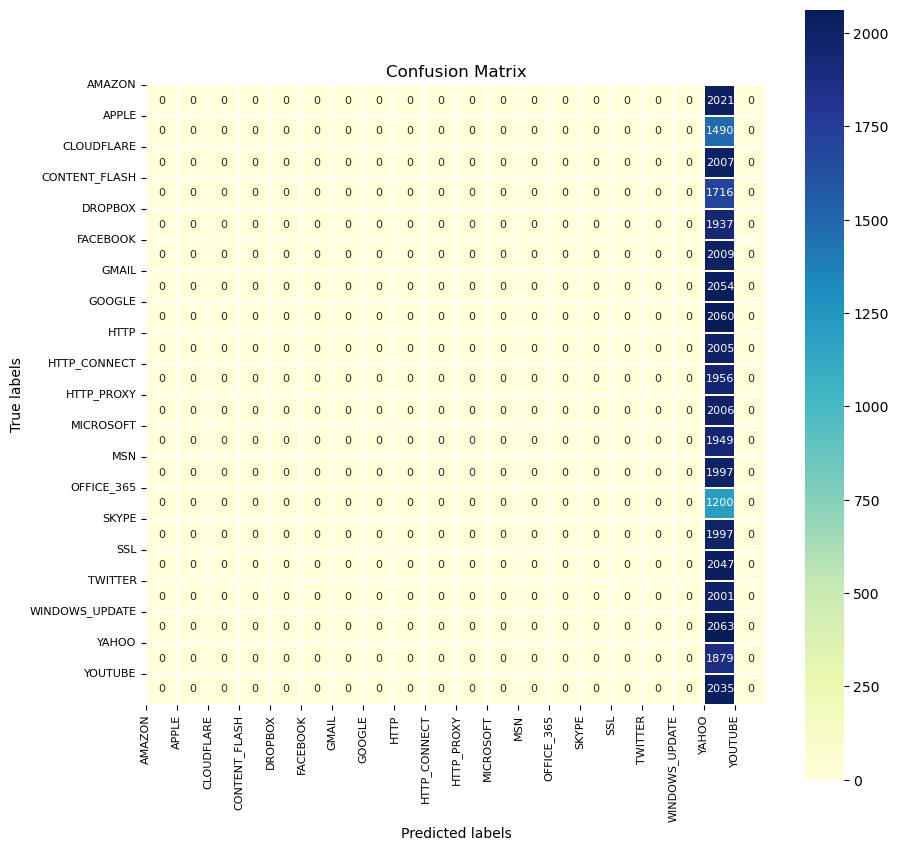

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,precision,recall,f1-score,support
AMAZON,0.051003,1.000000,0.097056,1960.000000
APPLE,0.000000,0.000000,0.000000,1518.000000
CLOUDFLARE,0.000000,0.000000,0.000000,2016.000000
CONTENT_FLASH,0.000000,0.000000,0.000000,1699.000000
DROPBOX,0.000000,0.000000,0.000000,1988.000000
FACEBOOK,0.000000,0.000000,0.000000,1964.000000
GMAIL,0.000000,0.000000,0.000000,2008.000000
GOOGLE,0.000000,0.000000,0.000000,1970.000000
HTTP,0.000000,0.000000,0.000000,2015.000000
HTTP_CONNECT,0.000000,0.000000,0.000000,2020.000000


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,precision,recall,f1-score,support
AMAZON,0.000000,0.000000,0.000000,2021.000000
APPLE,0.000000,0.000000,0.000000,1490.000000
CLOUDFLARE,0.000000,0.000000,0.000000,2007.000000
CONTENT_FLASH,0.000000,0.000000,0.000000,1716.000000
DROPBOX,0.000000,0.000000,0.000000,1937.000000
FACEBOOK,0.000000,0.000000,0.000000,2009.000000
GMAIL,0.000000,0.000000,0.000000,2054.000000
GOOGLE,0.000000,0.000000,0.000000,2060.000000
HTTP,0.000000,0.000000,0.000000,2005.000000
HTTP_CONNECT,0.000000,0.000000,0.000000,1956.000000


In [60]:
draw_confusion_matrix(y_test, dummy_pred, 'Dummy - PCA dataset', 'dummy-pca')
draw_confusion_matrix(y_test_corr, dummy_corr_pred, 'Dummy - IQR dataset', 'dummy-corr')

draw_classification_report(y_test, dummy_pred, 'Dummy - PCA dataset')
draw_classification_report(y_test_corr, dummy_corr_pred, 'Dummy - IQR dataset')

**NOTE:**
- **The above warnings are expected because the Dummy Classifier is unable to predict some value and hence they remain 0**

## 14. Model comparison plots

**NOTE:**
- **The below warnings are expected because some of the Classifiers are unable to predict values and hence they remain 0**

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted s

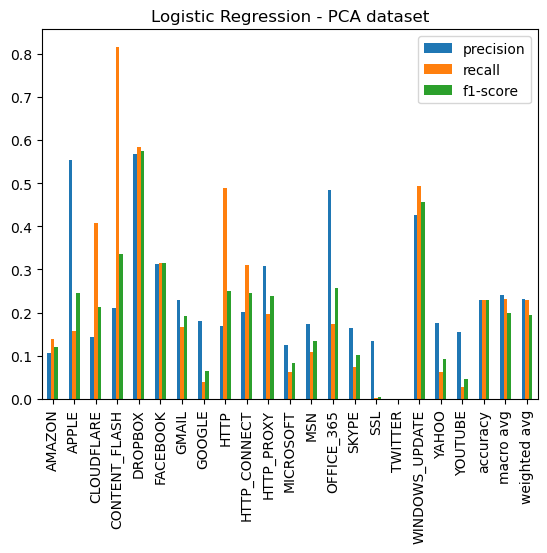

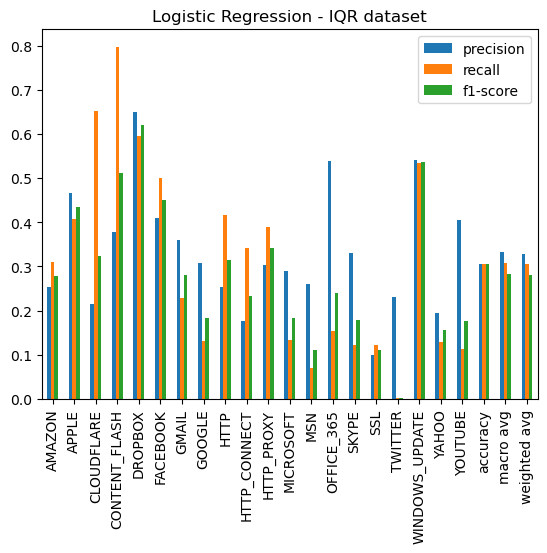

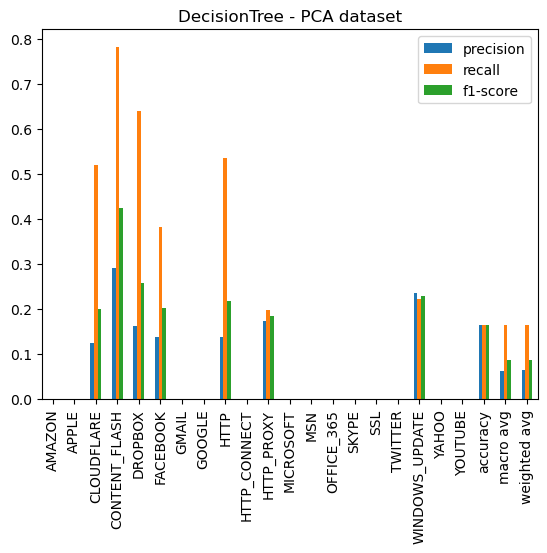

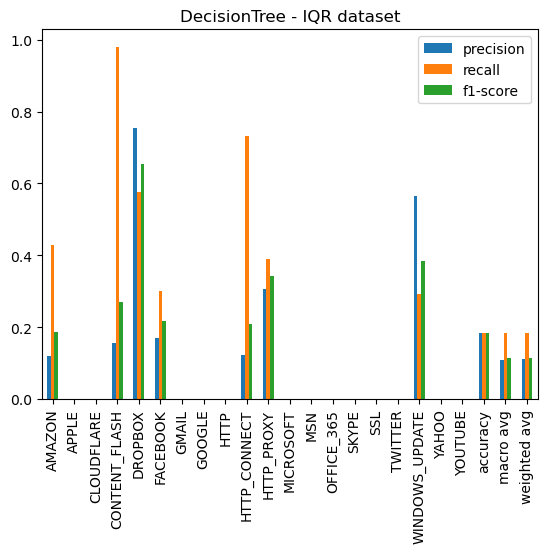

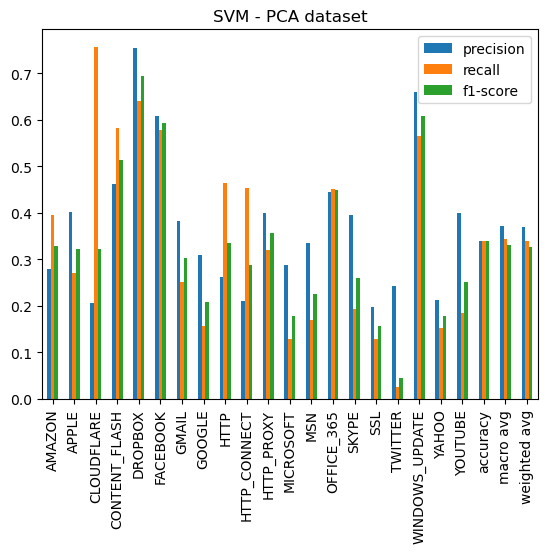

...

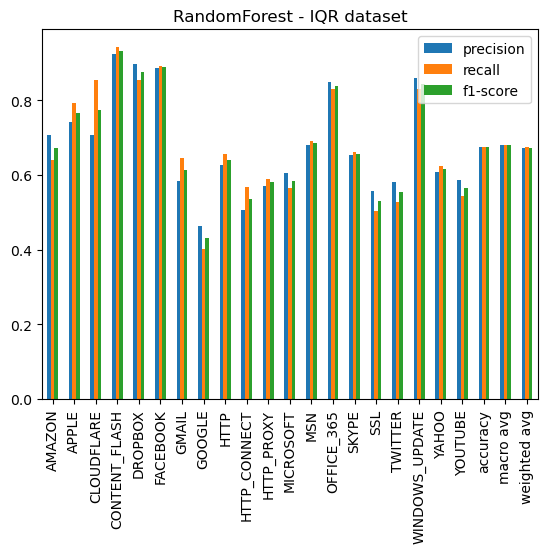

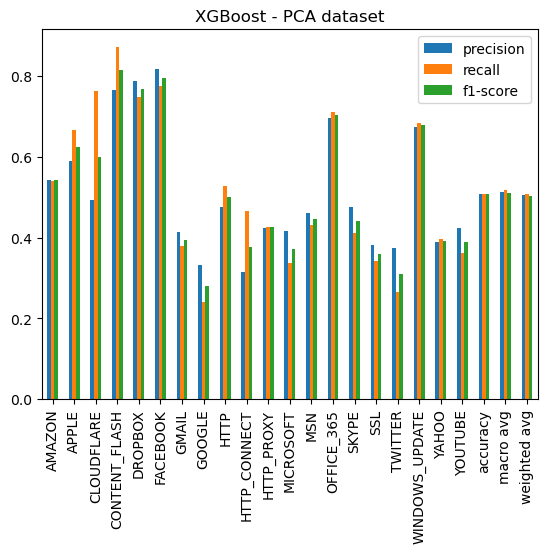

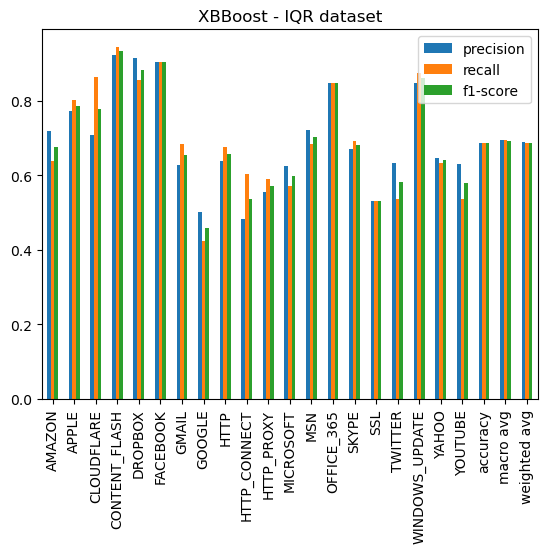

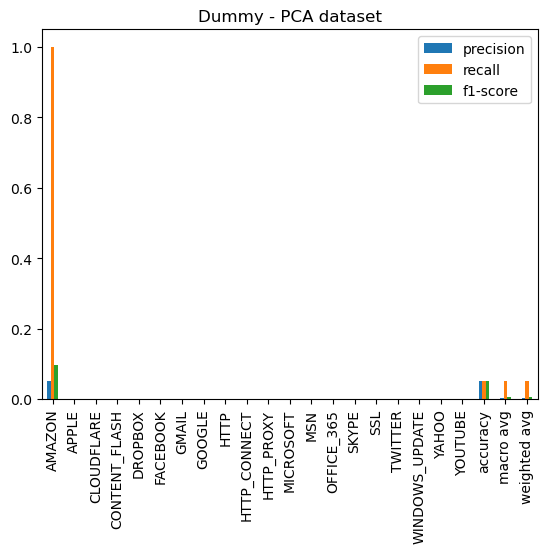

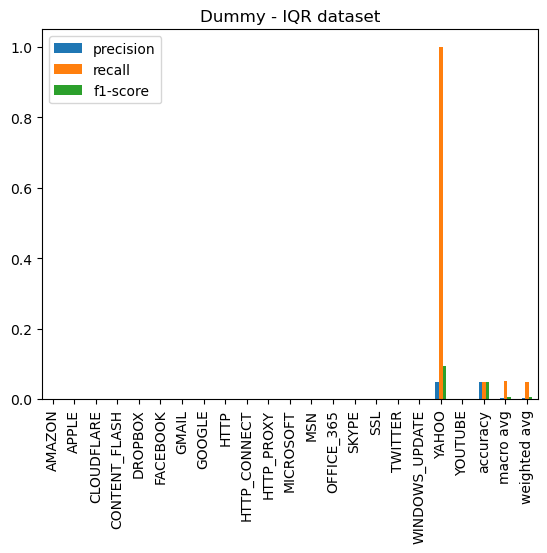

In [61]:
def dcr_plot(ytest, pred, title, fig):
    classes = le.classes_.tolist()
    report = classification_report(ytest, pred, target_names=classes, output_dict=True)
    # Convert the classification report to a DataFrame for formatting
    df_report = pd.DataFrame(report).transpose()
    df_report = df_report.style.set_caption(title)
    ax = df_report.data[['precision','recall','f1-score']].plot.bar()
    ax.set_title(title)
    ax.figure.savefig('images/' + fig + '.png')

dcr_plot(y_test, lr_pred, 'Logistic Regression - PCA dataset', 'lr-pca-v')
dcr_plot(y_test_corr, lr_corr_pred, 'Logistic Regression - IQR dataset', 'lr-corr-v')

dcr_plot(y_test, dt_pred, 'DecisionTree - PCA dataset', 'dt-pca-v')
dcr_plot(y_test_corr, dt_corr_pred, 'DecisionTree - IQR dataset', 'dt-corr-v')

dcr_plot(y_test, svm_pred, 'SVM - PCA dataset', 'svm-pca-v')
dcr_plot(y_test_corr, svm_corr_pred, 'SVM - IQR dataset', 'svm-corr-v')

dcr_plot(y_test, knn_pred, 'KNN - PCA dataset', 'knn-pca-v')
dcr_plot(y_test_corr, knn_corr_pred, 'KNN - IQR dataset', 'knn-corr-v')

dcr_plot(y_test, nb_pred, 'NaiveBayes - PCA dataset', 'nb-pca-v')
dcr_plot(y_test_corr, nb_corr_pred, 'NaiveBayes - IQR dataset', 'nb-corr-v')

dcr_plot(y_test, rf_pred, 'RandomForest - PCA dataset', 'rfc-pca-v')
dcr_plot(y_test_corr, rf_corr_pred, 'RandomForest - IQR dataset', 'rfc-corr-v')

dcr_plot(y_test, xg_pred, 'XGBoost - PCA dataset', 'xg-pca-v')
dcr_plot(y_test_corr, xg_corr_pred, 'XBBoost - IQR dataset', 'xg-corr-v')

dcr_plot(y_test, dummy_pred, 'Dummy - PCA dataset', 'dummy-pca-v')
dcr_plot(y_test_corr, dummy_corr_pred, 'Dummy - IQR dataset', 'dummy-corr-v')

**The above code is taking a really long time on a regular computer.** 

## 15. ROC - Receiver Operating Characteristic

ROC curves typically feature true positive rate (TPR) on the Y axis, and false positive rate (FPR) on the X axis. This means that the top left corner of the plot is the “ideal” point - a FPR of zero, and a TPR of one. This is not very realistic, but it does mean that a larger area under the curve (AUC) is usually better. The “steepness” of ROC curves is also important, since it is ideal to maximize the TPR while minimizing the FPR.

**ROC curves are typically used in binary classification, where the TPR and FPR can be defined unambiguously. Hence we are not using this in this project**